<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [12]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pandas_summary import DataFrameSummary
from pprint import pprint
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score,cross_val_predict, train_test_split, KFold
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, Ridge, Lasso
from sklearn.metrics import mean_squared_error


plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

sns.set_style("whitegrid")

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovateable:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

In [13]:
# Load the data
house = pd.read_csv('./housing.csv', )

### Initial EDA

In [14]:
# A:
print(house.shape)
house.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [15]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
Id               1460 non-null int64
MSSubClass       1460 non-null int64
MSZoning         1460 non-null object
LotFrontage      1201 non-null float64
LotArea          1460 non-null int64
Street           1460 non-null object
Alley            91 non-null object
LotShape         1460 non-null object
LandContour      1460 non-null object
Utilities        1460 non-null object
LotConfig        1460 non-null object
LandSlope        1460 non-null object
Neighborhood     1460 non-null object
Condition1       1460 non-null object
Condition2       1460 non-null object
BldgType         1460 non-null object
HouseStyle       1460 non-null object
OverallQual      1460 non-null int64
OverallCond      1460 non-null int64
YearBuilt        1460 non-null int64
YearRemodAdd     1460 non-null int64
RoofStyle        1460 non-null object
RoofMatl         1460 non-null object
Exterior1st      1460 non-n

#### Subset data on residential properties only

In [16]:
# Subset house DF on residential properties only
print(house.MSZoning.unique())
print(house.MSZoning.value_counts())

['RL' 'RM' 'C (all)' 'FV' 'RH']
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64


In [17]:
# house data contains 10 commercial properties.  Remove these to restrict analysis to residential properties only
mask = house.MSZoning != 'C (all)'
house = house.loc[mask,:].reset_index(drop=True)
house.shape

(1450, 81)

#### Continue EDA on residential properties only

In [18]:
house.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 81 columns):
Id               1450 non-null int64
MSSubClass       1450 non-null int64
MSZoning         1450 non-null object
LotFrontage      1191 non-null float64
LotArea          1450 non-null int64
Street           1450 non-null object
Alley            89 non-null object
LotShape         1450 non-null object
LandContour      1450 non-null object
Utilities        1450 non-null object
LotConfig        1450 non-null object
LandSlope        1450 non-null object
Neighborhood     1450 non-null object
Condition1       1450 non-null object
Condition2       1450 non-null object
BldgType         1450 non-null object
HouseStyle       1450 non-null object
OverallQual      1450 non-null int64
OverallCond      1450 non-null int64
YearBuilt        1450 non-null int64
YearRemodAdd     1450 non-null int64
RoofStyle        1450 non-null object
RoofMatl         1450 non-null object
Exterior1st      1450 non-n

In [19]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [20]:
house.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1450.000000,1450.000000,1191.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1442.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1371.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,731.364138,56.903448,70.052897,10523.831724,6.114483,5.582069,1971.593103,1985.049655,104.404300,445.162759,46.870345,567.375862,1059.408966,1164.773103,347.394483,5.531034,1517.698621,0.427586,0.057241,1.568966,0.384828,2.870345,1.046207,6.522069,0.616552,1978.627279,1.770345,473.277931,94.826897,46.537931,21.536552,3.433103,15.096552,2.777931,43.365517,6.312414,2007.812414,181654.942069
std,421.554345,42.265033,24.301013,10012.185355,1.372860,1.107330,30.022696,20.552319,181.486539,456.353871,161.828458,442.584978,439.207322,386.646095,437.094261,46.932966,525.154207,0.519394,0.238249,0.549549,0.503450,0.814645,0.219643,1.625324,0.644991,24.592779,0.745136,212.687621,125.560863,65.222761,60.838826,29.416948,55.893399,40.315051,497.636495,2.698244,1.326321,79176.485241
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1906.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,37900.000000
25%,366.250000,20.000000,59.000000,7544.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.500000,0.000000,0.000000,1131.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.500000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,731.500000,50.000000,70.000000,9496.000000,6.000000,5.000000,1973.000000,1994.000000,0.000000,384.000000,0.000000,475.000000,992.000000,1088.000000,0.000000,0.000000,1466.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163945.000000
75%,1096.750000,70.000000,80.000000,11613.500000,7.000000,6.000000,2001.000000,2004.000000,166.750000,713.750000,0.000000,808.000000,1301.500000,1392.000000,728.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Examine SalePrice column (target variable)

In [21]:
# Start by understanding the SalePrice column, since this is the target variable 
house_dfs = DataFrameSummary(house)
house_dfs['SalePrice']

AttributeError: module 'pandas.core.common' has no attribute 'is_numeric_dtype'

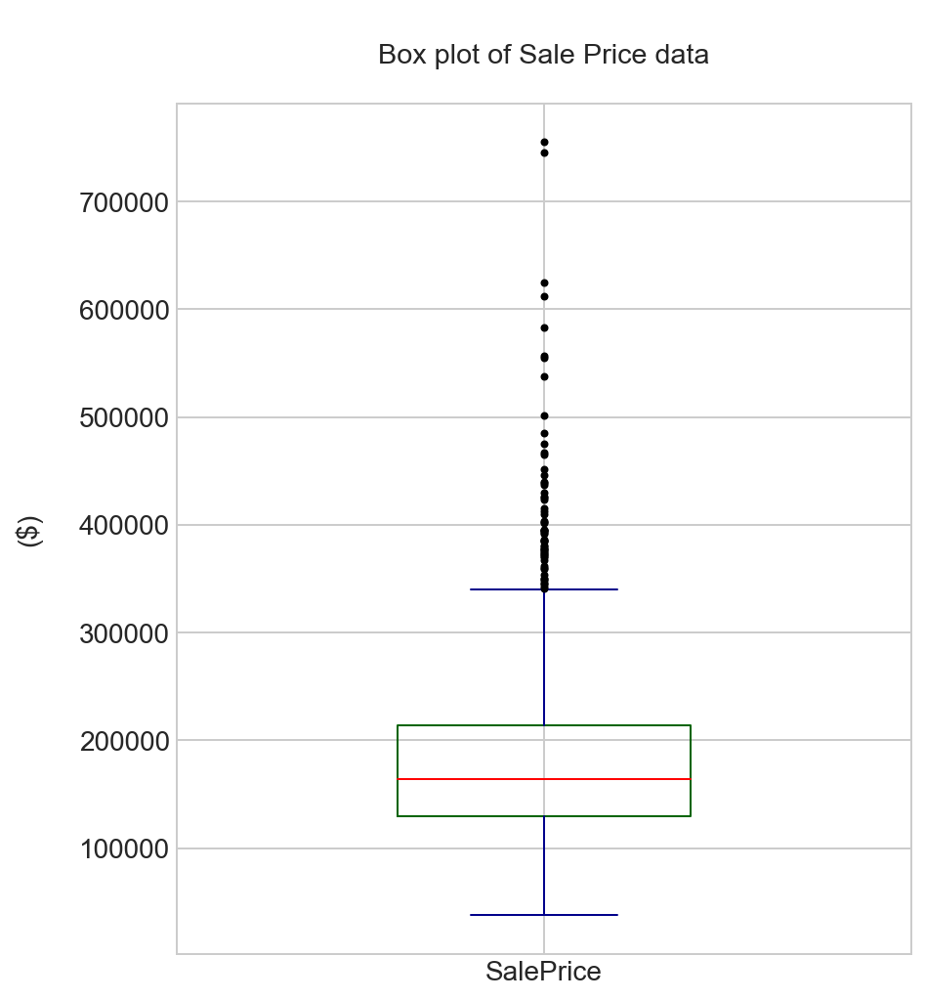

In [22]:
# SalePrice has no missing values, is type int and has a sensible range - no concerns on quality of target data.  
# Data distribution has a strong positive skew.  Let's view on a box plot.
chart_title = '\nBox plot of Sale Price data\n'
colors = dict(boxes='DarkGreen', whiskers='DarkBlue', medians='Red', caps='DarkBlue')

ax = house.loc[:,['SalePrice']].plot.box(figsize = (6,8), widths = 0.4, title = chart_title, 
                                         fontsize = 14, color=colors, whis=1.5, sym='k.', )

ax.set_ylabel('($)\n', size=14);

In [23]:
# Take note of how may SalePrice outliers (i.e. defined as >1.5 times the IQR above Q3) exist
upper_outlier_fence = 1.5 * house_dfs['SalePrice']['iqr'] + house_dfs['SalePrice']['75%']
mask = house['SalePrice'] > upper_outlier_fence
print(f"There are {mask.sum()} houses with sales prices considered as outliers \
(defined here as > ${int(upper_outlier_fence)} = Q3 + 1.5 * IQR)")

NameError: name 'house_dfs' is not defined

### Examine numeric, fixed features

In [24]:
# Subset house DF on numeric, fixed features
# Define dictionary of all column indexes for ease of identification
col_indexes = dict(enumerate(house.columns)) 
print(col_indexes)

{0: 'Id', 1: 'MSSubClass', 2: 'MSZoning', 3: 'LotFrontage', 4: 'LotArea', 5: 'Street', 6: 'Alley', 7: 'LotShape', 8: 'LandContour', 9: 'Utilities', 10: 'LotConfig', 11: 'LandSlope', 12: 'Neighborhood', 13: 'Condition1', 14: 'Condition2', 15: 'BldgType', 16: 'HouseStyle', 17: 'OverallQual', 18: 'OverallCond', 19: 'YearBuilt', 20: 'YearRemodAdd', 21: 'RoofStyle', 22: 'RoofMatl', 23: 'Exterior1st', 24: 'Exterior2nd', 25: 'MasVnrType', 26: 'MasVnrArea', 27: 'ExterQual', 28: 'ExterCond', 29: 'Foundation', 30: 'BsmtQual', 31: 'BsmtCond', 32: 'BsmtExposure', 33: 'BsmtFinType1', 34: 'BsmtFinSF1', 35: 'BsmtFinType2', 36: 'BsmtFinSF2', 37: 'BsmtUnfSF', 38: 'TotalBsmtSF', 39: 'Heating', 40: 'HeatingQC', 41: 'CentralAir', 42: 'Electrical', 43: '1stFlrSF', 44: '2ndFlrSF', 45: 'LowQualFinSF', 46: 'GrLivArea', 47: 'BsmtFullBath', 48: 'BsmtHalfBath', 49: 'FullBath', 50: 'HalfBath', 51: 'BedroomAbvGr', 52: 'KitchenAbvGr', 53: 'KitchenQual', 54: 'TotRmsAbvGrd', 55: 'Functional', 56: 'Fireplaces', 57: 'F

In [25]:
# Define list of numeric, fixed feature column indexes of interest for predicting sales price, 
# referencing the col_indexes dictionary above
ff_col_index = [3, 4, 19, 20, 26, 34, 36, 37, 38, 43, 44, 45, 46, 47, 48, 49, 50, 
                51, 52, 54, 56, 61, 62, 66, 67, 68, 69, 70, 71, 75, 76, 77, 80]

# Define data frame with quantifable, fixed features for residential properties only
house_ff = house.iloc[:,ff_col_index]

In [26]:
house_ff.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,2007,181500
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,2008,223500
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,2006,140000
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,2008,250000


#### Derive 2 new columns

In [27]:
# Derive and add 2 columns of interest: 1) Age (years) of property when sold, 
# 2) Age (years) of renovation when sold

# Note, I later realise during the correlation analysis, that these columns
# are simply a duplication of existing data

# Add age of property when sold
house_ff = house_ff.copy()
house_ff.insert(house_ff.shape[1]-1, 'AgeSold', 0)
house_ff.loc[:,'AgeSold'] = house_ff.loc[:,'YrSold'] - house_ff.loc[:,'YearBuilt']

# Add age of remodel when sold
house_ff.insert(house_ff.shape[1]-1, 'RemodAgeSold', 0)
house_ff.loc[:,'RemodAgeSold'] = house_ff.loc[:,'YrSold'] - house_ff.loc[:,'YearRemodAdd']

In [28]:
house_ff.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,AgeSold,RemodAgeSold,SalePrice
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,2008,5,5,208500
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,2007,31,31,181500
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,2008,7,6,223500
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,2006,91,36,140000
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,2008,8,8,250000


#### Continue EDA on quanitfable, fixed features for residential properties only

In [29]:
house_ff.head()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,AgeSold,RemodAgeSold,SalePrice
0,65.0,8450,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,0,0,2,2008,5,5,208500
1,80.0,9600,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,0,0,5,2007,31,31,181500
2,68.0,11250,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,0,0,9,2008,7,6,223500
3,60.0,9550,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,0,0,2,2006,91,36,140000
4,84.0,14260,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,0,0,12,2008,8,8,250000


In [30]:
# Examine quality of fixed feature data
house_ff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 35 columns):
LotFrontage      1191 non-null float64
LotArea          1450 non-null int64
YearBuilt        1450 non-null int64
YearRemodAdd     1450 non-null int64
MasVnrArea       1442 non-null float64
BsmtFinSF1       1450 non-null int64
BsmtFinSF2       1450 non-null int64
BsmtUnfSF        1450 non-null int64
TotalBsmtSF      1450 non-null int64
1stFlrSF         1450 non-null int64
2ndFlrSF         1450 non-null int64
LowQualFinSF     1450 non-null int64
GrLivArea        1450 non-null int64
BsmtFullBath     1450 non-null int64
BsmtHalfBath     1450 non-null int64
FullBath         1450 non-null int64
HalfBath         1450 non-null int64
BedroomAbvGr     1450 non-null int64
KitchenAbvGr     1450 non-null int64
TotRmsAbvGrd     1450 non-null int64
Fireplaces       1450 non-null int64
GarageCars       1450 non-null int64
GarageArea       1450 non-null int64
WoodDeckSF       1450 non-null int64
O

In [31]:
house_ff.describe()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,AgeSold,RemodAgeSold,SalePrice
count,1191.000000,1450.000000,1450.000000,1450.000000,1442.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,70.052897,10523.831724,1971.593103,1985.049655,104.404300,445.162759,46.870345,567.375862,1059.408966,1164.773103,347.394483,5.531034,1517.698621,0.427586,0.057241,1.568966,0.384828,2.870345,1.046207,6.522069,0.616552,1.770345,473.277931,94.826897,46.537931,21.536552,3.433103,15.096552,2.777931,43.365517,6.312414,2007.812414,36.219310,22.762759,181654.942069
std,24.301013,10012.185355,30.022696,20.552319,181.486539,456.353871,161.828458,442.584978,439.207322,386.646095,437.094261,46.932966,525.154207,0.519394,0.238249,0.549549,0.503450,0.814645,0.219643,1.625324,0.644991,0.745136,212.687621,125.560863,65.222761,60.838826,29.416948,55.893399,40.315051,497.636495,2.698244,1.326321,30.064048,20.541503,79176.485241
min,21.000000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,-1.000000,37900.000000
25%,59.000000,7544.500000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.500000,0.000000,0.000000,1131.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,7.000000,4.000000,130000.000000
50%,70.000000,9496.000000,1973.000000,1994.000000,0.000000,384.000000,0.000000,475.000000,992.000000,1088.000000,0.000000,0.000000,1466.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,34.000000,14.000000,163945.000000
75%,80.000000,11613.500000,2001.000000,2004.000000,166.750000,713.750000,0.000000,808.000000,1301.500000,1392.000000,728.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,54.000000,41.000000,214000.000000
max,313.000000,215245.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,136.000000,60.000000,755000.000000


#### Data quality investigation / cleaning

In [32]:
# Initial inspection suggests most data is complete and of the data type expected.
# There are some null values in LotFrontage and MasVnrArea columns to understand.
# No concerns on min/max/mean for the columns above

##### Investigate LotFrontage nan values

In [33]:
house_ff.LotFrontage.unique()

array([ 65.,  80.,  68.,  60.,  84.,  85.,  75.,  nan,  51.,  50.,  70.,
        91.,  72.,  66., 101.,  57.,  44., 110.,  98.,  47., 108., 112.,
        74., 115.,  61.,  48.,  33.,  52., 100.,  24.,  89.,  63.,  76.,
        81.,  95.,  69.,  21.,  32.,  78., 121., 122.,  40.,  73.,  77.,
        64.,  94., 105.,  34.,  90.,  55.,  88.,  82.,  71., 120., 107.,
        92., 134.,  62.,  86., 141.,  97.,  54.,  41.,  79., 174.,  99.,
        67.,  83.,  43., 103.,  93.,  30., 129., 140.,  35.,  37., 118.,
        87., 116., 150., 111.,  49.,  96.,  59.,  36.,  56., 102.,  58.,
        38., 109., 130.,  53., 137.,  45., 106., 104.,  42.,  39., 144.,
       114., 128., 149., 313., 168., 182., 138., 160., 152., 124., 153.,
        46.])

In [34]:
print(np.min(house_ff.LotFrontage), np.max(house_ff.LotFrontage))
# No zero LotFrontage values.  
# Perhaps these nans should be 0, because these houses don't have LotFrontage (i.e. linear feet of street
# connected to property?

21.0 313.0


In [35]:
# Investigate nan values in context of all fields within dataset to understand why these may be nan
mask=house.LotFrontage.isnull()
print(f"{mask.sum()} properties have LotFrontage = nan")
house.loc[mask,:].head()

259 properties have LotFrontage = nan


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
12,13,20,RL,NaN,12968,Pave,NaN,IR2,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1962,1962,Hip,CompShg,HdBoard,Plywood,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,737,Unf,0,175,912,GasA,TA,Y,SBrkr,912,0,0,912,1,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1962.0,Unf,1,352,TA,TA,Y,140,0,0,0,176,0,NaN,NaN,NaN,0,9,2008,WD,Normal,144000
14,15,20,RL,NaN,10920,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,MetalSd,MetalSd,BrkFace,212.0,TA,TA,CBlock,TA,TA,No,BLQ,733,Unf,0,520,1253,GasA,TA,Y,SBrkr,1253,0,0,1253,1,0,1,1,2,1,TA,5,Typ,1,Fa,Attchd,1960.0,RFn,1,352,TA,TA,Y,0,213,176,0,0,0,NaN,GdWo,NaN,0,5,2008,WD,Normal,157000
16,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,7,1970,1970,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,TA,TA,No,ALQ,578,Unf,0,426,1004,GasA,Ex,Y,SBrkr,1004,0,0,1004,1,0,1,0,2,1,TA,5,Typ,1,TA,Attchd,1970.0,Fin,2,480,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal,149000
24,25,20,RL,NaN,8246,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,8,1968,2001,Gable,CompShg,Plywood,Plywood,None,0.0,TA,Gd,CBlock,TA,TA,Mn,Rec,188,ALQ,668,204,1060,GasA,Ex,Y,SBrkr,1060,0,0,1060,1,0,1,0,3,1,Gd,6,Typ,1,TA,Attchd,1968.0,Unf,1,270,TA,TA,Y,406,90,0,0,0,0,NaN,MnPrv,NaN,0,5,2010,WD,Normal,154000


In [36]:
# Review LotConfig of these 259 properties with Nan LotFrontage.  Perhaps only Inside lots have null LotFrontage?
pd.value_counts(house.loc[mask,'LotConfig'])

Inside     134
Corner      62
CulDSac     49
FR2         14
Name: LotConfig, dtype: int64

In [37]:
# Compare with general distribution of LotConfig
house.LotConfig.value_counts()

Inside     1044
Corner      261
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64

In [38]:
# Conclusion: Unable to conclude the reason these homes have NaN for LotFrontage, but will set these to 0,
# based on an educated guess that these homes do not have street frontage.

In [39]:
house.loc[mask,'LotFrontage'] = 0

mask = house_ff.LotFrontage.isnull()
house_ff.loc[mask,'LotFrontage'] = 0

In [40]:
house_ff.LotFrontage.isnull().sum()

0

##### Investigate GaragYrBlt nan values

In [41]:
#house_ff.GarageYrBlt.unique()

In [42]:
#mask = house.GarageYrBlt.isnull() 
#print(f"The GarageYrBlt field has {mask.sum()} null entries.")

In [43]:
# Investigate nan values in context of all fields within the dataset to help identify reason for nan value
#pd.unique(house.loc[mask,'GarageType'])
# Analysis below shows that when the GarageYrBuilt field is null, the GarageType field is also null, meaning
# that the poperty doesn't have a garage.  We now understand when/why the GarageType field is null.  
# Conclusion: No cleaning of this field required.

Decided I wasn't going to use this field, so I removed the cleaning.

##### Investigate null values in the MasVnrArea field

In [44]:
# The initial EDA showed this field had the same number of null values as the MasVnrType field
mask = house.MasVnrArea.isnull()
house.loc[mask,:]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
231,235,60,RL,0.0,7851,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,625,Unf,0,235,860,GasA,Ex,Y,SBrkr,860,1100,0,1960,1,0,2,1,4,1,Gd,8,Typ,2,TA,BuiltIn,2002.0,Fin,2,440,TA,TA,Y,288,48,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,216500
525,530,20,RL,0.0,32668,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,3,1957,1975,Hip,CompShg,Wd Sdng,Stone,NaN,NaN,Gd,TA,PConc,TA,TA,No,Rec,1219,Unf,0,816,2035,GasA,TA,Y,SBrkr,2515,0,0,2515,1,0,3,0,4,2,TA,9,Maj1,2,TA,Attchd,1975.0,RFn,2,484,TA,TA,Y,0,0,200,0,0,0,NaN,NaN,NaN,0,3,2007,WD,Alloca,200624
645,651,60,FV,65.0,8125,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,2Story,7,6,2007,2007,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,813,813,GasA,Ex,Y,SBrkr,822,843,0,1665,0,0,2,1,3,1,Gd,7,Typ,0,NaN,Attchd,2007.0,RFn,2,562,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,205950
928,937,20,RL,67.0,10083,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,833,Unf,0,343,1176,GasA,Ex,Y,SBrkr,1200,0,0,1200,1,0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,2003.0,RFn,2,555,TA,TA,Y,0,41,0,0,0,0,NaN,NaN,NaN,0,8,2009,WD,Normal,184900
965,974,20,FV,95.0,11639,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,1Story,7,5,2007,2008,Gable,CompShg,CemntBd,CmentBd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,1428,1428,GasA,Ex,Y,SBrkr,1428,0,0,1428,0,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,2007.0,Fin,2,480,TA,TA,Y,0,120,0,0,0,0,NaN,NaN,NaN,0,12,2008,New,Partial,182000
969,978,120,FV,35.0,4274,Pave,Pave,IR1,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,TwnhsE,1Story,7,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,1106,Unf,0,135,1241,GasA,Ex,Y,SBrkr,1241,0,0,1241,1,0,1,1,1,1,Gd,4,Typ,0,NaN,Attchd,2007.0,Fin,2,569,TA,TA,Y,0,116,0,0,0,0,NaN,NaN,NaN,0,11,2007,New,Partial,199900
1234,1244,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,10,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Ex,TA,PConc,Ex,Gd,Gd,GLQ,1386,Unf,0,690,2076,GasA,Ex,Y,SBrkr,2076,0,0,2076,1,0,2,1,2,1,Ex,7,Typ,1,Gd,Attchd,2006.0,Fin,3,850,TA,TA,Y,216,229,0,0,0,0,NaN,NaN,NaN,0,9,2006,New,Partial,465000
1269,1279,60,RL,75.0,9473,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,8,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,No,GLQ,804,Unf,0,324,1128,GasA,Ex,Y,SBrkr,1128,903,0,2031,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2002.0,RFn,2,577,TA,TA,Y,0,211,0,0,0,0,NaN,NaN,NaN,0,3,2008,WD,Normal,237000


In [45]:
house.MasVnrType.unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn', nan], dtype=object)

In [46]:
house.MasVnrType.value_counts()

None       854
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [47]:
# Set MasVnrTpe to None and MasVnrArea to 0 for these houses in both the full DF (house) and 
# the subset DF of fixed features (house_ff)
house.loc[mask,'MasVnrType'] = 'None'
house.loc[mask,'MasVnrArea'] = 0

In [48]:
mask = house_ff.MasVnrArea.isnull()
house_ff.loc[mask,'MasVnrArea'] = 0

In [49]:
# Verify cleansing
house.MasVnrType.value_counts()

None       862
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64

In [50]:
house.MasVnrArea.isnull().sum()

0

In [51]:
house_ff.MasVnrArea.isnull().sum()

0

In [52]:
house_ff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 35 columns):
LotFrontage      1450 non-null float64
LotArea          1450 non-null int64
YearBuilt        1450 non-null int64
YearRemodAdd     1450 non-null int64
MasVnrArea       1450 non-null float64
BsmtFinSF1       1450 non-null int64
BsmtFinSF2       1450 non-null int64
BsmtUnfSF        1450 non-null int64
TotalBsmtSF      1450 non-null int64
1stFlrSF         1450 non-null int64
2ndFlrSF         1450 non-null int64
LowQualFinSF     1450 non-null int64
GrLivArea        1450 non-null int64
BsmtFullBath     1450 non-null int64
BsmtHalfBath     1450 non-null int64
FullBath         1450 non-null int64
HalfBath         1450 non-null int64
BedroomAbvGr     1450 non-null int64
KitchenAbvGr     1450 non-null int64
TotRmsAbvGrd     1450 non-null int64
Fireplaces       1450 non-null int64
GarageCars       1450 non-null int64
GarageArea       1450 non-null int64
WoodDeckSF       1450 non-null int64
O

In [53]:
# I'm now happy with the quality of my fixed feature data in the house_ff DF

### Investigate correlations between numerical, fixed features and sales price

In [54]:
# Define function to generate a correlation heatmap, accepting a DF and correlation method as arguments
def correlation_heat_map(df, corr_method):
    
    corrs = df.corr(method=corr_method)

    # Set the default matplotlib figure size:
    fig, ax = plt.subplots(figsize=(40,40))
    
    # Generate a mask for the upper triangle (taken from seaborn example gallery)
    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    cmap_ticks = [-1, -0.8, -0.6, -0.4, -0.2, 0, 0.2, 0.4, 0.6, 0.8, 1]
    title = '\nHeatmap of ' + corr_method + ' correlation between quantifiable fixed features and sales price'
    
    # Plot the heatmap with seaborn.
    # Assign the matplotlib axis the function returns. This will let us resize the labels.
    ax = sns.heatmap(corrs, mask=mask, annot=True, fmt='.2f', annot_kws={"size":18},
                     cmap="RdBu_r", cbar_kws=dict(ticks=cmap_ticks), center=0)
    ax.set_title(title, fontsize=28)
    
    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=20, rotation=60)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=20, rotation=0)
    
    # Change font size of colormap
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=24) ;

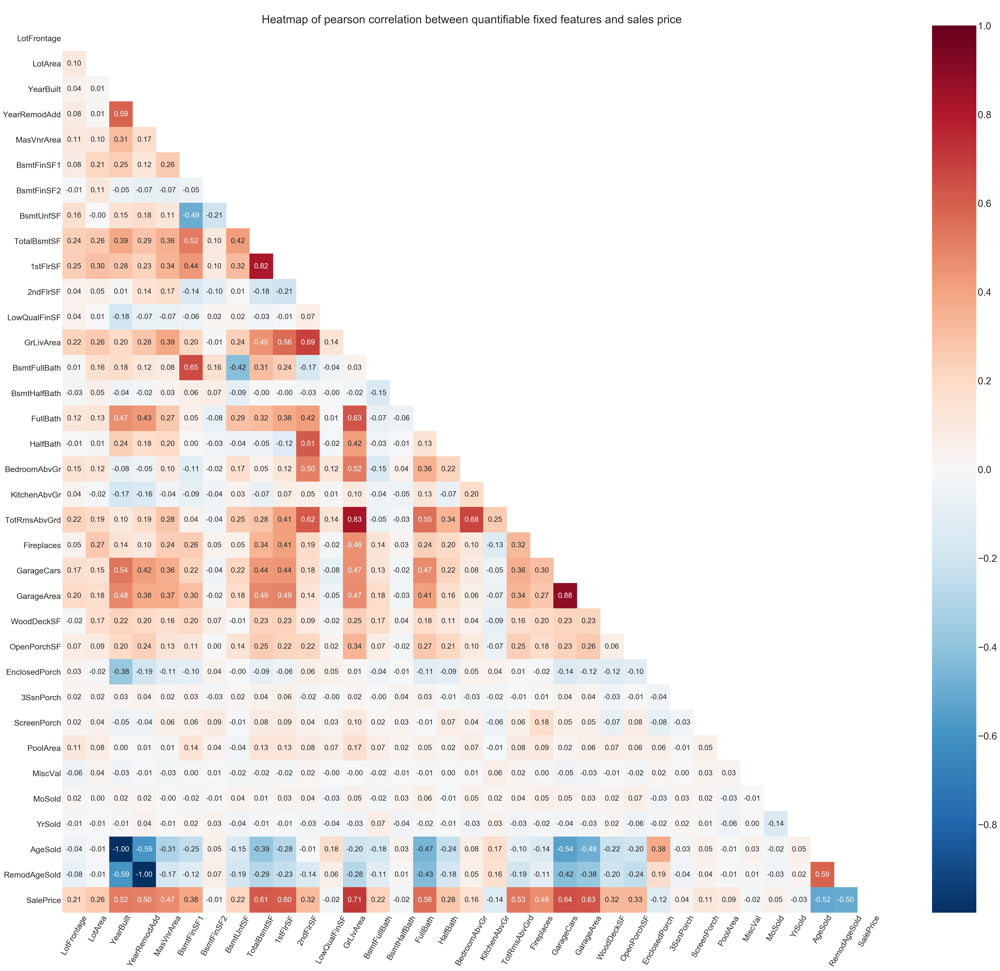

In [55]:
# Generate pearson correlation heatmap
correlation_heat_map(house_ff, 'pearson')

##### Observations from Pearson correlation heatmap
    

Person correlation > +- 0.5 between SalePrice and:
- YearBuilt/AgeSold (+/-0.52)
- YearRemodAdd/RedmodAdgeSold (+/- 0.5)
- TotalBsmtSF (0.61)
- 1stFlrSF (0.6)
- GrLivArea (0.71)
- FullBath (0.56)
- TotRmsAbvGrd (0.53)
- GarageCars (0.64)
- GarageArea (0.63)

Lets' now look at intercorrelations between these variables:
- YearBuilt/AgeSold is equivalent to the same field.  Will only include the 'YearBuilt' field in my predictor list.
- YearRemodAdd/RedmodAdgeSold is equivalent to the same field.  Will only include 1 of these fields, if either.
- YearBuilt/YearRemodd has a relatively high correlation (0.59) - will only include 1 of these fields in model.  YearRemodAdd appears less correlated with other variables, so I'm going to choose this - even though its correlation with sales price is slightly less than YearBuilt.
- TotalBsmtSF is highly correlated with 1stFlrSF (0.82).  Will include TotalBsmtSF in model.
- GrLivArea is highly correlated with TotRmsAbvGrd (0.83).  Will include GRLivArea in model, as this has the higher correlation with SalePrice. My feeling is that GRLivArea will also reprsent the space of those houses that have 0 basement space.
- FullBath has highest correlation with GrLivArea and TotRmsAbveGrd (to be excluded from model).  Will include this, as the field feels like it may capture different features to the GRLivArea field.
- GarageCars and GarageArea have an understandably high correlation (0.88). Will include GarageCars only, as it feels like this variable captures the functional nature of the garage.

A lot of the variables proposed for inclusion in my predictors above are related to space, and I'd like to include some non-space related predictors in my model to reflect specific features that may influence the sales price.  Based on the correlation heatmap above, I'm going to include Fireplaces (correlation 0.46), WooddeckSF (correlation 0.32) and OpenPorchSF (correlation 0.33).  These predictors reflect specific features and have minimal correlation with other predictors.

In [56]:
# Assign list of numerical predictors based on analysis of correlation data above
predictors_num = ['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 
              'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF' ]

In [57]:
# A quick look at a summary of these predictors to ensure there are no surprises...
house_ff[predictors_num].describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF
count,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,1985.049655,1059.408966,1517.698621,1.568966,1.770345,0.616552,94.826897,46.537931
std,20.552319,439.207322,525.154207,0.549549,0.745136,0.644991,125.560863,65.222761
min,1950.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1967.000000,796.000000,1131.250000,1.000000,1.000000,0.000000,0.000000,0.000000
50%,1994.000000,992.000000,1466.000000,2.000000,2.000000,1.000000,0.000000,25.000000
75%,2004.000000,1301.500000,1779.000000,2.000000,2.000000,1.000000,168.000000,68.000000
max,2010.000000,6110.000000,5642.000000,3.000000,4.000000,3.000000,857.000000,547.000000


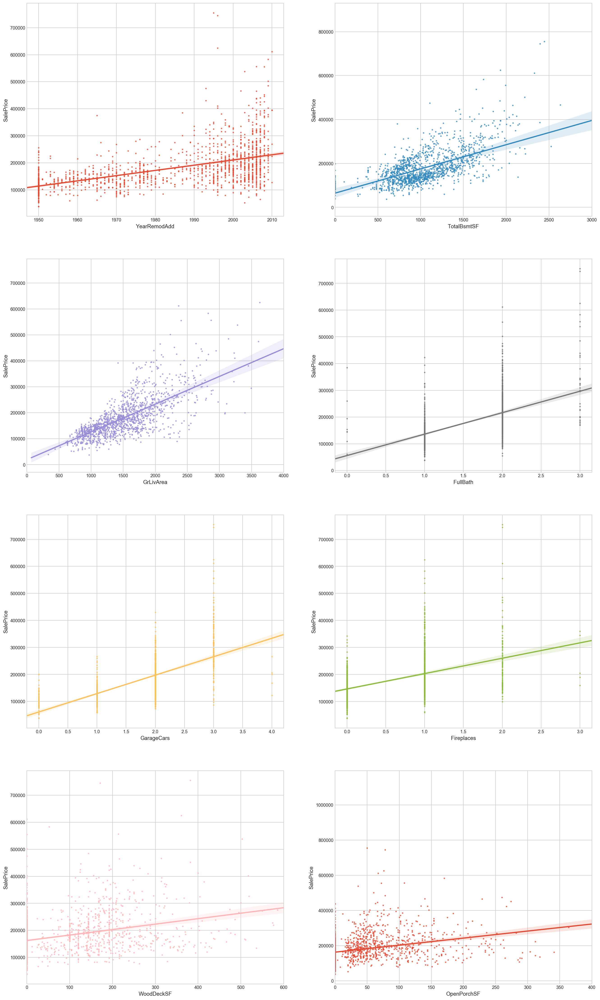

In [58]:
# Quickly plot relationship between predictors and sales price to confirm linear relationship visually
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(20,40))

sns.set(font_scale=1.8)

sns.regplot('YearRemodAdd','SalePrice', house, ax=ax[0,0], scatter_kws={"s": 10}) 
sns.regplot('TotalBsmtSF','SalePrice', house, ax=ax[0,1], scatter_kws={"s": 10}) 
sns.regplot('GrLivArea','SalePrice', house, ax=ax[1,0], scatter_kws={"s": 10}) 
sns.regplot('FullBath','SalePrice', house, ax=ax[1,1], scatter_kws={"s": 10} ) 
sns.regplot('GarageCars','SalePrice', house, ax=ax[2,0], scatter_kws={"s": 10}) 
sns.regplot('Fireplaces','SalePrice', house, ax=ax[2,1], scatter_kws={"s": 10}) 
sns.regplot('WoodDeckSF','SalePrice', house, ax=ax[3,0], scatter_kws={"s": 10}) 
sns.regplot('OpenPorchSF','SalePrice', house, ax=ax[3,1], scatter_kws={"s": 10}) 


ax[0,1].set_xlim(0,3000)           # I've intentionally narrowed the axes and excluded some data points
ax[0,1].set_xlim(0,3000)           # to enable me to see the relationship more clearly 
ax[1,0].set_xlim(0,4000)
ax[3,0].set_xlim(0,600)
ax[3,1].set_xlim(0,400)  ;



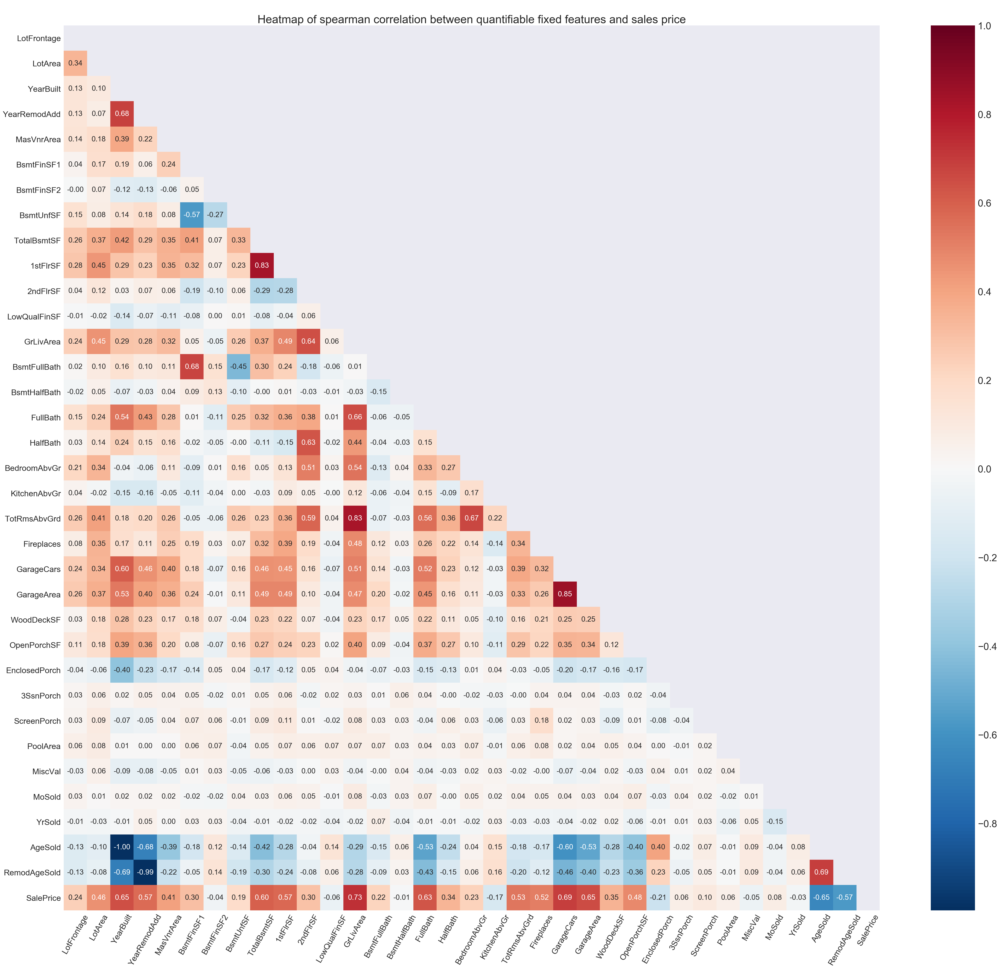

In [59]:
# Generate spearman correlation heatmap to see if we can identify any linear relationships with 
# non-uniform rates of change
correlation_heat_map(house_ff, 'spearman')

##### Observations from Spearman correlation heatmap

The spearman correlation heatmap supports my predictor selection from the previous section.  A couple of predictors have seen reasonably significant increases in their correlation with the sales price, as a result of considering the Spearman correlation.  These are LotArea and OpenPorchSF.  Would be good to plot the relationship between these fields and the saleprice to see if we can identify a suitable polynomial transformation for them to include in the model.

In [60]:
house_ff.describe()

,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,AgeSold,RemodAgeSold,SalePrice
count,1450.00000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,57.54000,10523.831724,1971.593103,1985.049655,103.828276,445.162759,46.870345,567.375862,1059.408966,1164.773103,347.394483,5.531034,1517.698621,0.427586,0.057241,1.568966,0.384828,2.870345,1.046207,6.522069,0.616552,1.770345,473.277931,94.826897,46.537931,21.536552,3.433103,15.096552,2.777931,43.365517,6.312414,2007.812414,36.219310,22.762759,181654.942069
std,34.71992,10012.185355,30.022696,20.552319,181.150114,456.353871,161.828458,442.584978,439.207322,386.646095,437.094261,46.932966,525.154207,0.519394,0.238249,0.549549,0.503450,0.814645,0.219643,1.625324,0.644991,0.745136,212.687621,125.560863,65.222761,60.838826,29.416948,55.893399,40.315051,497.636495,2.698244,1.326321,30.064048,20.541503,79176.485241
min,0.00000,1300.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,-1.000000,37900.000000
25%,41.25000,7544.500000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.500000,0.000000,0.000000,1131.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,7.000000,4.000000,130000.000000
50%,63.00000,9496.000000,1973.000000,1994.000000,0.000000,384.000000,0.000000,475.000000,992.000000,1088.000000,0.000000,0.000000,1466.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,34.000000,14.000000,163945.000000
75%,79.00000,11613.500000,2001.000000,2004.000000,166.000000,713.750000,0.000000,808.000000,1301.500000,1392.000000,728.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,54.000000,41.000000,214000.000000
max,313.00000,215245.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,136.000000,60.000000,755000.000000


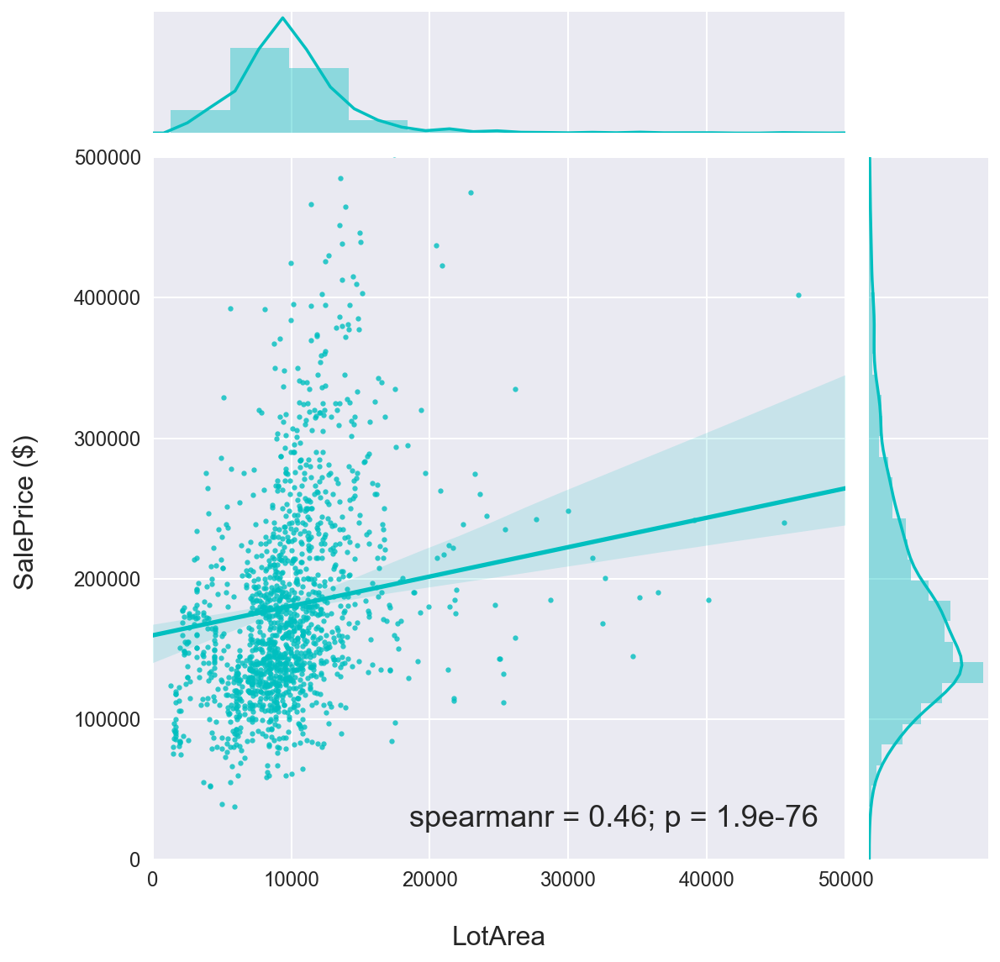

In [61]:
# Plot SalePrice vs LotArea
from scipy.stats import spearmanr
sns.jointplot(house_ff['LotArea'].values, house_ff['SalePrice'].values, size=8, 
              color='c', kind='reg', stat_func=spearmanr, scatter_kws={'s': 10}) 

plt.xlabel('\nLotArea', fontsize=16)
plt.xticks(fontsize=12)

plt.ylabel('SalePrice ($) \n', fontsize=16)
plt.yticks(fontsize=12)
plt.ylim(0, 500000)                     # Zoom in on area with vast majority of data points to observe relationship
plt.xlim(0, 50000)  ;

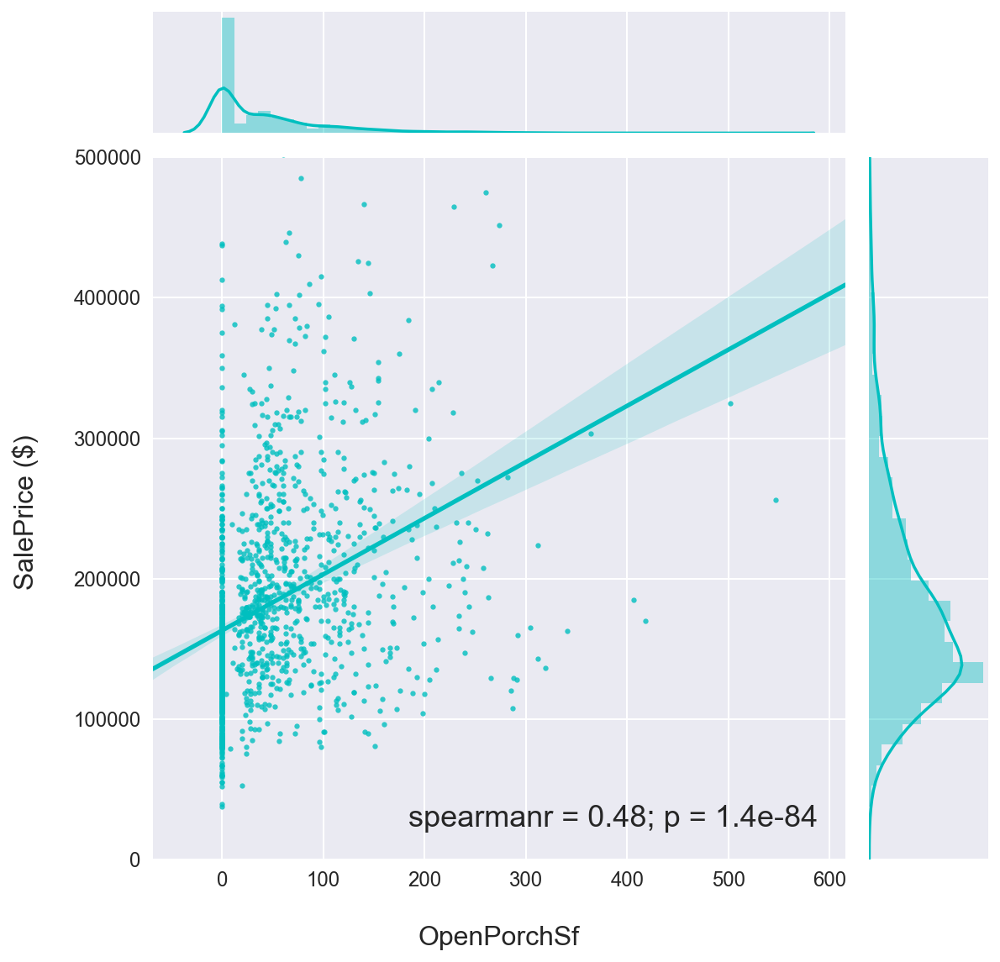

In [62]:
# Plot SalePrice vs OpenPorchSF
from scipy.stats import spearmanr
sns.jointplot(house_ff['OpenPorchSF'].values, house_ff['SalePrice'].values, size=8, 
              color='c', kind='reg', stat_func=spearmanr, scatter_kws={'s':10}) 

plt.xlabel('\nOpenPorchSf', fontsize=16)
plt.xticks(fontsize=12)

plt.ylabel('SalePrice ($) \n', fontsize=16)
plt.yticks(fontsize=12)
plt.ylim(0, 500000)   ;             # Zoom in on area with vast majority of data points to observe relationship



I could have potentially done a polynomial transform on these (potential) predictors and included them in my 
model, but I don't feel the linear correlation is strong enough to justify it.

### Investigate relationship between categorical variables for fixed features, and the sales price

#### Neighborhood investigation

In [63]:
# Neighborhood feels like a field to immediately investigate.

In [64]:
house['Neighborhood'].nunique()

25

In [65]:
house['Neighborhood'].isnull().sum()

0

In [66]:
house['Neighborhood'].value_counts()

NAmes      225
CollgCr    150
OldTown    112
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
ClearCr     28
IDOTRR      28
SWISU       25
StoneBr     25
Blmngtn     17
MeadowV     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

In [67]:
# No identified data cleaning requirements!!!

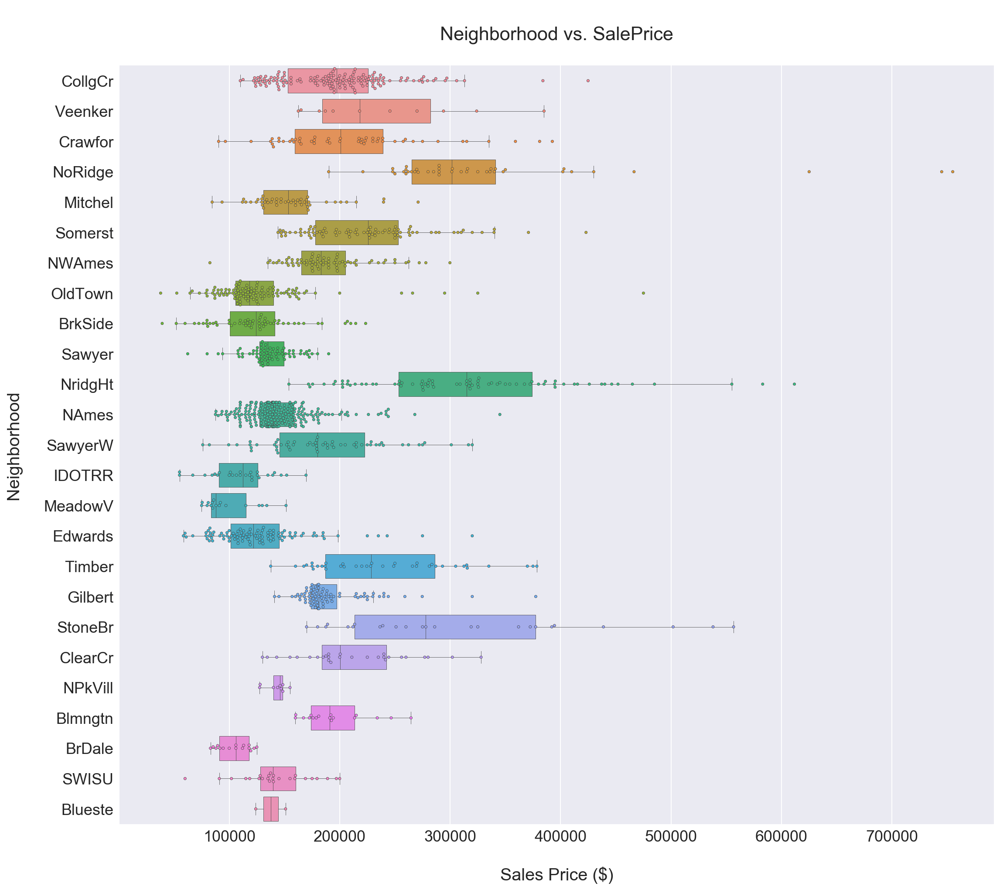

In [68]:
# Plot a box and swarm plot of Neighborhood vs. SalePrice
fig, ax = plt.subplots(figsize=(16,16))
y_axis = 'Neighborhood'
x_axis = 'SalePrice'
ax = sns.boxplot(x=x_axis, y=y_axis, data=house, linewidth=0.4, orient='h', fliersize=0.3, )
ax = sns.swarmplot(x=x_axis, y=y_axis, data=house, linewidth=0.4, size=3)

ax.set_title('\n' + y_axis + ' vs. ' + x_axis + '\n')
ax.set_xlabel('\nSales Price ($)')

ax.set_ylabel(y_axis + '\n') ;

I will definitely include neighborhood in my list of predictors.  There is a good distribution of data across the different neighborhoods, and there is a significant variation in sales price across the different category values.

In [69]:
# Define a separate list of categorical predictors, and include neighborhood.  I'm going to keep this separate 
# from the numerical predictors for now, as I may (if time permits) see the difference in how my model 
# performs with numerical predictors only vs. the full combination of my selected predictors
predictors_cat = ['Neighborhood']

#### Identify categorical columns to investigate

In [70]:
# Print col_indexes to help identify column indexes for categorical fixed features of interest
print(col_indexes)

{0: 'Id', 1: 'MSSubClass', 2: 'MSZoning', 3: 'LotFrontage', 4: 'LotArea', 5: 'Street', 6: 'Alley', 7: 'LotShape', 8: 'LandContour', 9: 'Utilities', 10: 'LotConfig', 11: 'LandSlope', 12: 'Neighborhood', 13: 'Condition1', 14: 'Condition2', 15: 'BldgType', 16: 'HouseStyle', 17: 'OverallQual', 18: 'OverallCond', 19: 'YearBuilt', 20: 'YearRemodAdd', 21: 'RoofStyle', 22: 'RoofMatl', 23: 'Exterior1st', 24: 'Exterior2nd', 25: 'MasVnrType', 26: 'MasVnrArea', 27: 'ExterQual', 28: 'ExterCond', 29: 'Foundation', 30: 'BsmtQual', 31: 'BsmtCond', 32: 'BsmtExposure', 33: 'BsmtFinType1', 34: 'BsmtFinSF1', 35: 'BsmtFinType2', 36: 'BsmtFinSF2', 37: 'BsmtUnfSF', 38: 'TotalBsmtSF', 39: 'Heating', 40: 'HeatingQC', 41: 'CentralAir', 42: 'Electrical', 43: '1stFlrSF', 44: '2ndFlrSF', 45: 'LowQualFinSF', 46: 'GrLivArea', 47: 'BsmtFullBath', 48: 'BsmtHalfBath', 49: 'FullBath', 50: 'HalfBath', 51: 'BedroomAbvGr', 52: 'KitchenAbvGr', 53: 'KitchenQual', 54: 'TotRmsAbvGrd', 55: 'Functional', 56: 'Fireplaces', 57: 'F

In [71]:
# Identify and define categorical variables of interest to understand their relationship with sales price
cat_cols_to_eda = [5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 29, 30, 32, 58, 65]
cat_cols_to_eda = [col_indexes[key] for key in cat_cols_to_eda]
cat_cols_to_eda

['Street',
 'Alley',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'Foundation',
 'BsmtQual',
 'BsmtExposure',
 'GarageType',
 'PavedDrive']

In [72]:
# EDA of these variables
house[cat_cols_to_eda].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 16 columns):
Street          1450 non-null object
Alley           89 non-null object
LotShape        1450 non-null object
LandContour     1450 non-null object
Utilities       1450 non-null object
LotConfig       1450 non-null object
LandSlope       1450 non-null object
Condition1      1450 non-null object
Condition2      1450 non-null object
BldgType        1450 non-null object
HouseStyle      1450 non-null object
Foundation      1450 non-null object
BsmtQual        1413 non-null object
BsmtExposure    1412 non-null object
GarageType      1371 non-null object
PavedDrive      1450 non-null object
dtypes: object(16)
memory usage: 181.3+ KB


##### Investigate BsmtQual field

In [73]:
house['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [74]:
# Investigate cause of nan values
mask = house['BsmtQual'].isnull()
house[mask]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,18,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1296,0,0,1296,0,0,2,0,2,2,TA,6,Typ,0,NaN,CarPort,1967.0,Unf,2,516,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,500,10,2006,WD,Normal,90000
38,40,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,AdjLand,82000
88,91,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1950,1950,Gable,CompShg,BrkFace,Wd Sdng,None,0.0,TA,TA,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,FuseA,1040,0,0,1040,0,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1950.0,Unf,2,420,TA,TA,Y,0,29,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal,109900
99,103,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,SawyerW,Norm,Norm,Duplex,1Story,5,5,1979,1979,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,Fa,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1535,0,0,1535,0,0,2,0,4,2,TA,8,Typ,0,NaN,Attchd,1979.0,Unf,2,410,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Alloca,118964
153,157,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1950,1950,Hip,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,FuseF,1040,0,0,1040,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1950.0,Unf,2,625,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,109500
179,183,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Artery,Norm,1Fam,1Story,5,6,1957,2006,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,98.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1340,0,0,1340,0,0,1,0,3,1,TA,7,Typ,1,Gd,Attchd,1957.0,RFn,1,252,TA,TA,Y,116,0,0,180,0,0,NaN,MnPrv,NaN,0,6,2007,WD,Normal,120000
256,260,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,5,1956,1956,Gable,CompShg,BrkFace,BrkFace,None,0.0,TA,TA,PConc,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Gd,Y,FuseA,882,0,0,882,0,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1956.0,Unf,1,308,TA,TA,Y,0,45,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,97000
339,343,90,RL,0.0,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,Duplex,1Story,3,4,1949,1950,Gable,CompShg,Stucco,Stucco,BrkFace,340.0,TA,TA,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,Wall,Fa,N,FuseA,1040,0,0,1040,0,0,2,0,2,2,TA,6,Typ,0,NaN,Detchd,1949.0,Unf,2,400,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,87500
359,363,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,SFoyer,7,5,2003,2003,Gable,CompShg,HdBoard,HdBoard,BrkFace,500.0,Gd,TA,Slab,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,495,1427,0,1922,0,0,3,0,4,1,Gd,7,Typ,1,Ex,BuiltIn,2003.0,RFn,2,672,TA,TA,Y,0,0,177,0,0,0,NaN,NaN,NaN,0,7,2009,ConLD,Normal,198500
368,372,50,RL,80.0,17120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,ClearCr,Feedr,Norm,1Fam,1.5Fin,4,4,1959,1959,Gable,CompShg,WdShing,Plywood,None,0.0,TA,TA,CBlock,NaN,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1120,468,0,1588,0,0,2,0,4,1,TA,7,Min2,1,Gd,D

The TotalBsmtSF = 0 for all houses where BsmtQual is null.  Safe to assume these homes have no basement, and hence BsmtQual should be 'NA', rather than nan.

In [75]:
house.loc[mask, 'BsmtQual'] = 'NA'

In [76]:
house['BsmtQual'].unique()

array(['Gd', 'TA', 'Ex', 'NA', 'Fa'], dtype=object)

##### Investigate BsmtExposure field

In [77]:
house['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [78]:
mask = house['BsmtExposure'].isnull()
house[mask]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
17,18,90,RL,72.0,10791,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,4,5,1967,1967,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,Slab,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1296,0,0,1296,0,0,2,0,2,2,TA,6,Typ,0,NaN,CarPort,1967.0,Unf,2,516,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,Shed,500,10,2006,WD,Normal,90000
38,40,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,4,5,1955,1955,Gable,CompShg,AsbShng,Plywood,None,0.0,TA,TA,PConc,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,N,FuseP,1152,0,0,1152,0,0,2,0,2,2,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,AdjLand,82000
88,91,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1950,1950,Gable,CompShg,BrkFace,Wd Sdng,None,0.0,TA,TA,Slab,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,FuseA,1040,0,0,1040,0,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1950.0,Unf,2,420,TA,TA,Y,0,29,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal,109900
99,103,90,RL,64.0,7018,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,SawyerW,Norm,Norm,Duplex,1Story,5,5,1979,1979,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,Fa,Slab,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1535,0,0,1535,0,0,2,0,4,2,TA,8,Typ,0,NaN,Attchd,1979.0,Unf,2,410,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Alloca,118964
153,157,20,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1950,1950,Hip,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,FuseF,1040,0,0,1040,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1950.0,Unf,2,625,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,109500
179,183,20,RL,60.0,9060,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Artery,Norm,1Fam,1Story,5,6,1957,2006,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,98.0,TA,TA,PConc,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,1340,0,0,1340,0,0,1,0,3,1,TA,7,Typ,1,Gd,Attchd,1957.0,RFn,1,252,TA,TA,Y,116,0,0,180,0,0,NaN,MnPrv,NaN,0,6,2007,WD,Normal,120000
256,260,20,RM,70.0,12702,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,5,1956,1956,Gable,CompShg,BrkFace,BrkFace,None,0.0,TA,TA,PConc,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Gd,Y,FuseA,882,0,0,882,0,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1956.0,Unf,1,308,TA,TA,Y,0,45,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,97000
339,343,90,RL,0.0,8544,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,Duplex,1Story,3,4,1949,1950,Gable,CompShg,Stucco,Stucco,BrkFace,340.0,TA,TA,Slab,NA,NaN,NaN,NaN,0,NaN,0,0,0,Wall,Fa,N,FuseA,1040,0,0,1040,0,0,2,0,2,2,TA,6,Typ,0,NaN,Detchd,1949.0,Unf,2,400,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,87500
359,363,85,RL,64.0,7301,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,SFoyer,7,5,2003,2003,Gable,CompShg,HdBoard,HdBoard,BrkFace,500.0,Gd,TA,Slab,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,Ex,Y,SBrkr,495,1427,0,1922,0,0,3,0,4,1,Gd,7,Typ,1,Ex,BuiltIn,2003.0,RFn,2,672,TA,TA,Y,0,0,177,0,0,0,NaN,NaN,NaN,0,7,2009,ConLD,Normal,198500
368,372,50,RL,80.0,17120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,ClearCr,Feedr,Norm,1Fam,1.5Fin,4,4,1959,1959,Gable,CompShg,WdShing,Plywood,None,0.0,TA,TA,CBlock,NA,NaN,NaN,NaN,0,NaN,0,0,0,GasA,TA,Y,SBrkr,1120,468,0,1588,0,0,2,0,4,1,TA,7,Min2,1,Gd,Detchd,1991

In [79]:
# BsmtExposure field has NaN values for the samer reason the BsmtQual field did.
house.loc[mask, 'BsmtExposure'] = 'NA'

In [80]:
house['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', 'NA'], dtype=object)

##### Investigate Alley field

In [81]:
house['Alley'].unique()

array([nan, 'Grvl', 'Pave'], dtype=object)

In [82]:
house['Alley'].isnull().sum()

1361

In [83]:
# Based on the data dictionary, it's safe to assume that these null values should be set to NA
# house['Alley'] = house['Alley'].map(lambda x: 'NA' if x=='NaN' else x) ???why doesn't this work??
# house['Alley'].isnull().sum()
mask = house['Alley'].isnull()
house.loc[mask,'Alley'] = 'NA'
print(house['Alley'].isnull().sum())

0


In [84]:
house['Alley'].value_counts()

NA      1361
Grvl      50
Pave      39
Name: Alley, dtype: int64

##### Investigate GarageType field

In [85]:
house['GarageType'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', nan, 'Basment', '2Types'],
      dtype=object)

In [86]:
mask = house['GarageType'].isnull()
# Change NaN values to 'NA'
house.loc[mask,'GarageType'] = 'NA'

In [87]:
house['GarageType'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', 'NA', 'Basment',
       '2Types'], dtype=object)

In [88]:
house['GarageType'].value_counts()

Attchd     870
Detchd     381
BuiltIn     88
NA          79
Basment     18
CarPort      8
2Types       6
Name: GarageType, dtype: int64

In [89]:
# One last check of data before further EDA of the categorical fields
house[cat_cols_to_eda].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 16 columns):
Street          1450 non-null object
Alley           1450 non-null object
LotShape        1450 non-null object
LandContour     1450 non-null object
Utilities       1450 non-null object
LotConfig       1450 non-null object
LandSlope       1450 non-null object
Condition1      1450 non-null object
Condition2      1450 non-null object
BldgType        1450 non-null object
HouseStyle      1450 non-null object
Foundation      1450 non-null object
BsmtQual        1450 non-null object
BsmtExposure    1450 non-null object
GarageType      1450 non-null object
PavedDrive      1450 non-null object
dtypes: object(16)
memory usage: 181.3+ KB


#### Continue EDA of categorical Fixed Features

In [90]:
# Define function to create box and swarmplots for a value against a list of categorical variables.
# The swarmplot, along with the column's value_counts (which will be included in the x-axis label) will help to 
# understand the distribution of data across the different values for each field and will also facilitate 
# EDA of the field.

def plot_price_boxplot(cat_var, df, y_var):
    fig, ax = plt.subplots(figsize=(12,5))

    y_axis = y_var
    x_axis = cat_var
    ax = sns.boxplot(x=x_axis, y=y_axis, data=df, linewidth=1.2, color='black', fliersize=0.3)
    ax = sns.swarmplot(x=x_axis, y=y_axis, data=df, linewidth=0.4, palette='Set2', size=3)
    plt.setp(ax.lines, color='red')
    plt.xticks()

    ax.set_title('\n\n' + y_axis + ' vs. ' + x_axis, fontdict={'size':14})
    ax.set_ylabel(y_var + ' ($)\n', fontsize=14)
    
    if y_var == 'SalePrice':
        ax.set_ylim(0,500000)     # Set upper limit of y-axis to $500,000 to enable a clear view of the plots.  This is well beyond the upper_outlier_fence defined earlier.
        y_ticks = list(range(0,600000,100000))
    elif y_var == 'Residuals':
        ax.set_ylim(-200000,200000)     # Set upper limit of y-axis to $300,000 to enable a clear view of the plots. 
        y_ticks = list(range(-200000,200000,50000)) 
    ax.set_yticklabels(y_ticks, fontsize=12)
    ax.set_xlabel(pd.DataFrame(df[cat_var].value_counts()), fontsize=12)
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=12) ;


In [91]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


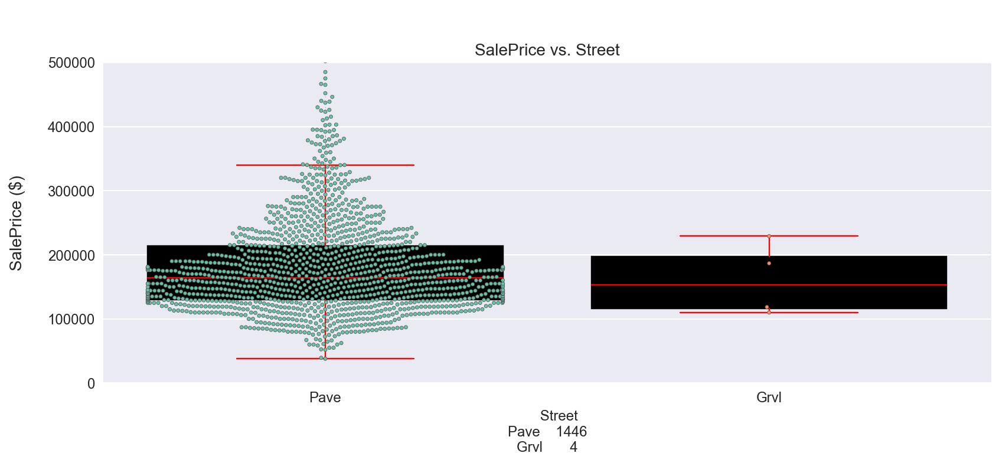

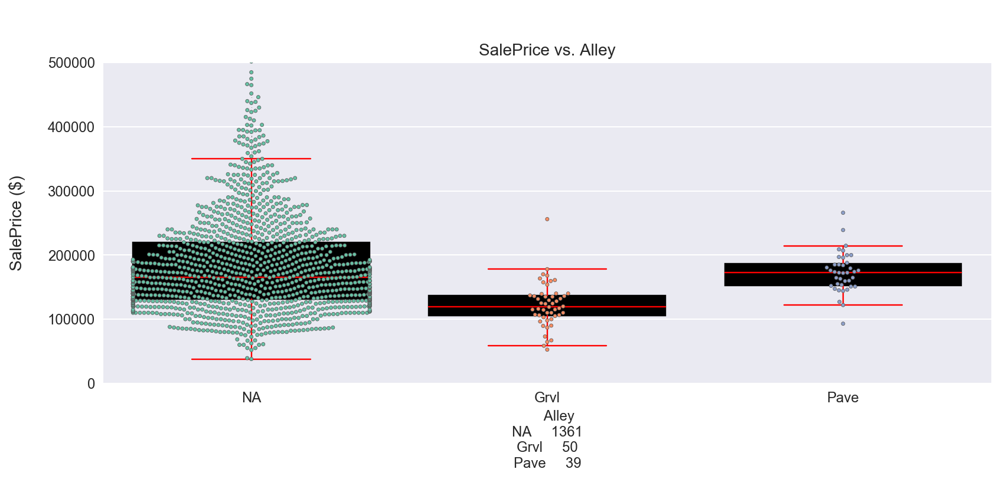

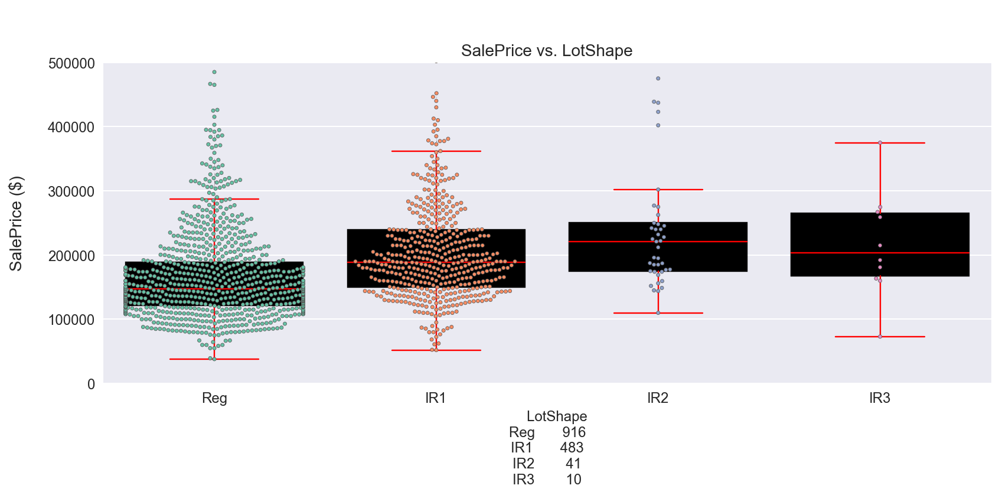

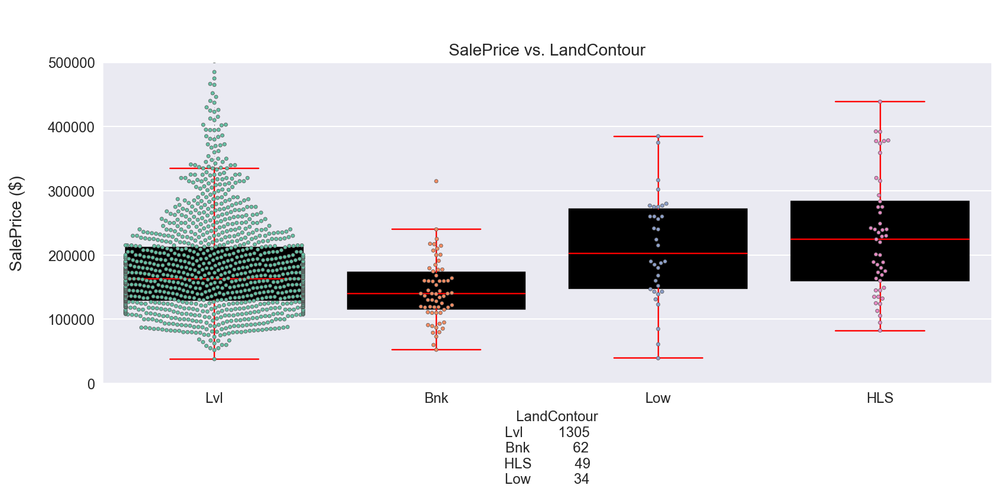

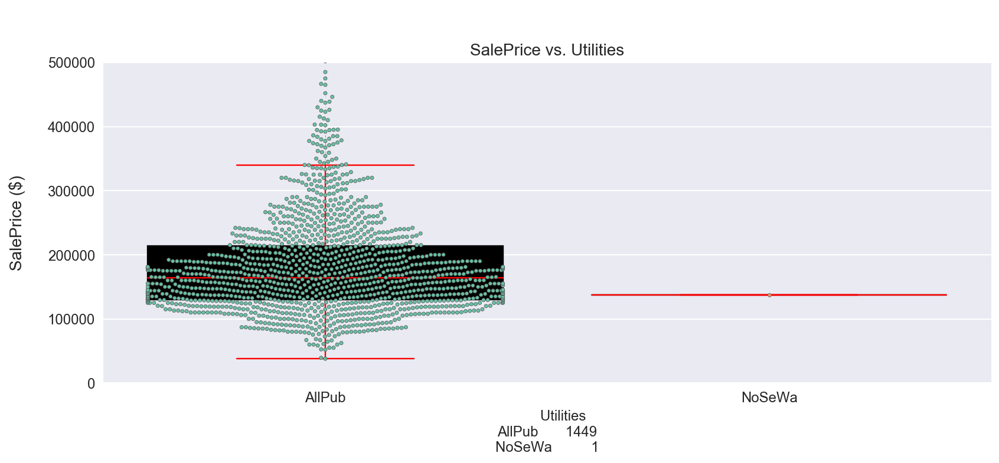

...

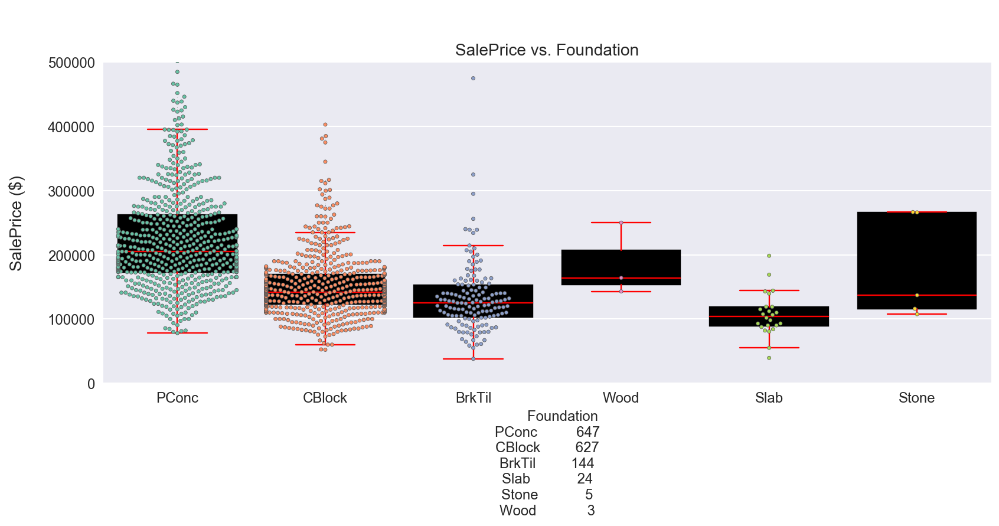

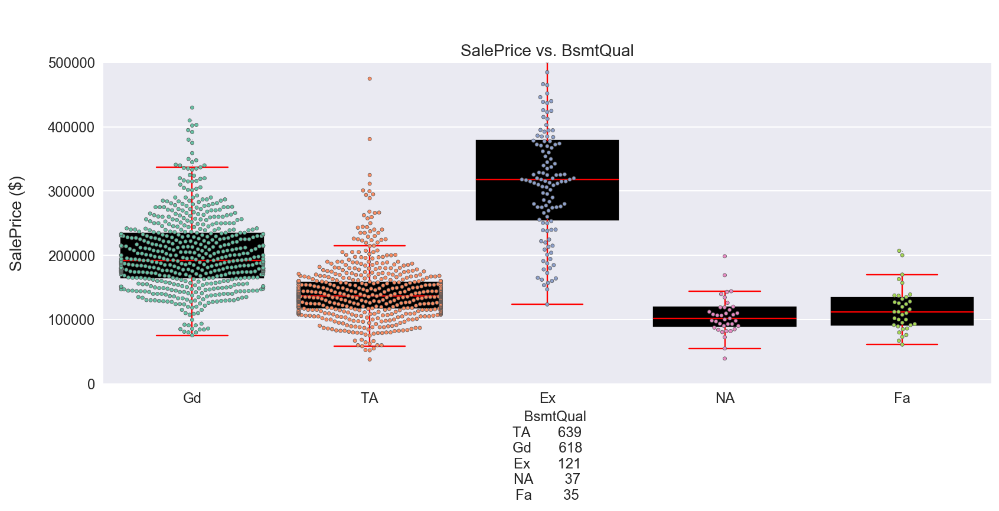

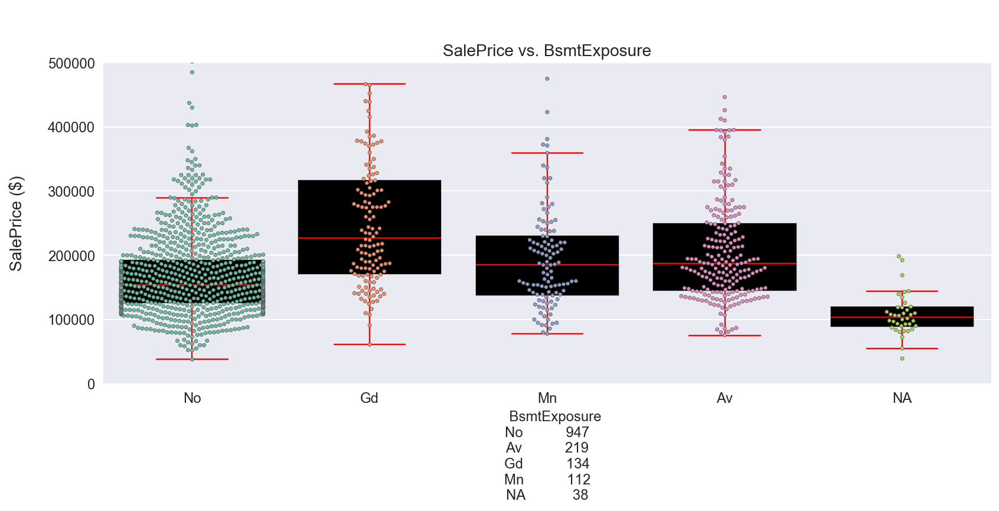

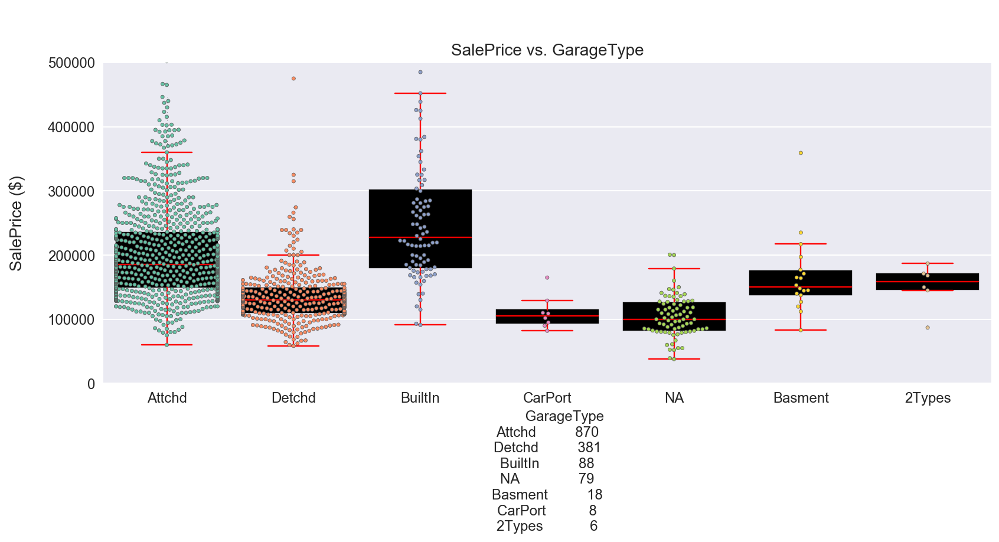

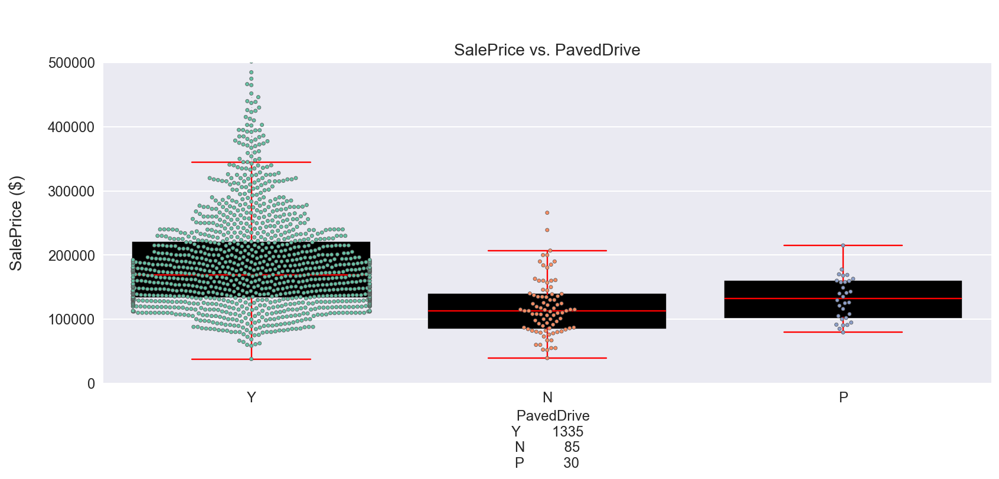

In [92]:
# For each categorical variable in the cat_cols_to_eda list, create a box and swarmplot, with the 
# value_counts for each field included in the x-axis label
for cat_var in cat_cols_to_eda:
    plot_price_boxplot(cat_var, house, 'SalePrice')
    

Reviewing the boxplots and swarmplots above, I'm looking for categorical variables that demonstrate both:
1) a variation in sale price across their different values, and 
2) have a 'reasonable' spread of datapoints across their different values

I feel that the following fields satisfy these criteria:
- LotShape
- Condition1
- BldgType
- HouseStyle  
- Foundation
- BsmtQual
- BsmtExposure
- GarageType


In [93]:
# Let's compare these to the numeric predictors already selected....
predictors_num
# I'm satisfied that these represent quite different characteristics of these homes.  
# One 'watch-out' is that we have quite a few proposed predictors related to the Basement.

['YearRemodAdd',
 'TotalBsmtSF',
 'GrLivArea',
 'FullBath',
 'GarageCars',
 'Fireplaces',
 'WoodDeckSF',
 'OpenPorchSF']

In [94]:
# One last look at the house data related to these fields...
house[['LotShape', 'Condition1', 'BldgType', 'HouseStyle', 
       'Foundation', 'BsmtQual','BsmtExposure', 'GarageType']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 8 columns):
LotShape        1450 non-null object
Condition1      1450 non-null object
BldgType        1450 non-null object
HouseStyle      1450 non-null object
Foundation      1450 non-null object
BsmtQual        1450 non-null object
BsmtExposure    1450 non-null object
GarageType      1450 non-null object
dtypes: object(8)
memory usage: 90.7+ KB


In [95]:
house[['LotShape', 'Condition1', 'BldgType', 'HouseStyle', 
       'Foundation', 'BsmtQual','BsmtExposure', 'GarageType']].describe()

,LotShape,Condition1,BldgType,HouseStyle,Foundation,BsmtQual,BsmtExposure,GarageType
count,1450,1450,1450,1450,1450,1450,1450,1450
unique,4,9,5,8,6,5,5,7
top,Reg,Norm,1Fam,1Story,PConc,TA,No,Attchd
freq,916,1252,1211,722,647,639,947,870


In [96]:
# Add these variables to our list of categorical predictors
predictors_cat.extend(['LotShape', 'Condition1', 'BldgType', 'HouseStyle', 
                       'Foundation', 'BsmtQual','BsmtExposure', 'GarageType'])

### Train and evaluate a model to predict sales price

#### Define predictor and target

In [97]:
# I have both numeric and categorical predictors, which I've kept separate up until now
print(f"Proposed numeric predictors: \n{predictors_num}\n")   # Numeric predictors
print(f"Proposed categorical predictors: \n{predictors_cat}\n")   # Categorical predictors

# Define list of all proposed predictors
predictors_all = predictors_num + predictors_cat
print(f"All proposed predictors: \n{predictors_all}\n")

Proposed numeric predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF']

Proposed categorical predictors: 
['Neighborhood', 'LotShape', 'Condition1', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType']

All proposed predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF', 'Neighborhood', 'LotShape', 'Condition1', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType']



In [98]:
# Model is to be trained on pre-2010 data and evaluated on 2010 data.  
# Let's check to see how many rows we expect in each train-test split
print(f"We expect {(house['YrSold'] < 2010).sum()} homes in the training set.")
print(f"We expect {(house['YrSold'] == 2010).sum()} homes in the testing set.")


We expect 1278 homes in the training set.
We expect 172 homes in the testing set.


In [99]:
# Define predictor DF and target series
X = house[predictors_all]
y = house['SalePrice']

In [100]:
# Ensure there are no surprises in my X and y variables
print(type(y))
print(y.shape)
y.head()

<class 'pandas.core.series.Series'>
(1450,)


0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [101]:
print(type(X))
print(X.shape)
X.head()

<class 'pandas.core.frame.DataFrame'>
(1450, 17)


,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood,LotShape,Condition1,BldgType,HouseStyle,Foundation,BsmtQual,BsmtExposure,GarageType
0,2003,856,1710,2,2,0,0,61,CollgCr,Reg,Norm,1Fam,2Story,PConc,Gd,No,Attchd
1,1976,1262,1262,2,2,1,298,0,Veenker,Reg,Feedr,1Fam,1Story,CBlock,Gd,Gd,Attchd
2,2002,920,1786,2,2,1,0,42,CollgCr,IR1,Norm,1Fam,2Story,PConc,Gd,Mn,Attchd
3,1970,756,1717,1,3,1,0,35,Crawfor,IR1,Norm,1Fam,2Story,BrkTil,TA,No,Detchd
4,2000,1145,2198,2,3,1,192,84,NoRidge,IR1,Norm,1Fam,2Story,PConc,Gd,Av,Attchd


In [102]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 17 columns):
YearRemodAdd    1450 non-null int64
TotalBsmtSF     1450 non-null int64
GrLivArea       1450 non-null int64
FullBath        1450 non-null int64
GarageCars      1450 non-null int64
Fireplaces      1450 non-null int64
WoodDeckSF      1450 non-null int64
OpenPorchSF     1450 non-null int64
Neighborhood    1450 non-null object
LotShape        1450 non-null object
Condition1      1450 non-null object
BldgType        1450 non-null object
HouseStyle      1450 non-null object
Foundation      1450 non-null object
BsmtQual        1450 non-null object
BsmtExposure    1450 non-null object
GarageType      1450 non-null object
dtypes: int64(8), object(9)
memory usage: 192.7+ KB


In [103]:
# Dumify categorical variables in predictor data, dropping the first value for each field
X_dumified = pd.get_dummies(X, drop_first=True)
X_dumified.head()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,LotShape_IR2,LotShape_IR3,LotShape_Reg,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
0,2003,856,1710,2,2,0,0,61,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0
1,1976,1262,1262,2,2,1,298,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0
2,2002,920,1786,2,2,1,0,42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0
3,1970,756,1717,1,3,1,0,35,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0
4,2000,1145,2198,2,3,1,192,84,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0


In [104]:
# Define train and test data sets
X_train = X_dumified[house['YrSold'] < 2010]  
X_test = X_dumified[house['YrSold'] == 2010]

y_train = y[house['YrSold'] < 2010]
y_test = y[house['YrSold'] == 2010]

In [105]:
print(type(X_train), type(X_test), type(y_train), type(y_test))
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'> <class 'pandas.core.series.Series'>
(1278, 73) (172, 73) (1278,) (172,)


In [106]:
# Data types and shapes are as expected

In [107]:
# Standardise my predictor
# Take mean and std of train data only, and transform both train and test data with it
ss = StandardScaler()
ss.fit(X_train)
X_train_ss = ss.transform(X_train)
X_test_ss = ss.transform(X_test)


In [108]:
# Take a quick look at standardised train and test predictor data to ensure no suprises

In [109]:
pd.DataFrame(X_train_ss, columns=X_dumified.columns).describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,LotShape_IR2,LotShape_IR3,LotShape_Reg,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
count,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03
mean,3.204879e-15,-1.811714e-16,1.060706e-16,-1.021614e-16,6.532768e-17,1.174508e-16,1.202307e-16,-5.138474e-17,1.071674e-16,-1.750903e-16,-7.388456e-17,-4.506915e-16,-1.431649e-16,-3.570001e-16,-8.965181e-17,-2.953645e-16,-6.671763e-16,5.101553e-17,-1.796945e-16,5.151504e-17,-2.215234e-17,6.665247e-16,-2.432414e-18,-5.937695e-17,-1.698346e-16,5.792185e-16,3.357599e-17,2.663493e-16,3.692056e-17,2.480627e-16,1.554138e-16,2.044313e-16,5.178000e-16,1.990018e-16,-1.356939e-16,-4.142487e-16,-3.622559e-17,1.876650e-16,-1.051584e-16,3.871012e-16,-8.270206e-17,2.214365e-16,1.952881e-16,-3.196886e-16,-2.738637e-16,-4.135537e-16,-1.584544e-16,-1.076039e-15,1.407325e-17,-1.263118e-16,5.027712e-17,1.932031e-16,2.152252e-16,5.256185e-16,-2.658280e-17,-1.231844e-16,-8.995586e-17,1.813886e-16,1.683252e-16,1.723539e-16,-1.713114e-16,1.433387e-16,3.593022e-16,5.707485e-17,3.653833e-16,1.262249e-16,1.461186e-16,6.515393e-17,-4.435897e-16,1.265724e-16,-2.076239e-17,-3.057891e-17,-1.546754e-16
std,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.0

Mean and std of X_train_ss columns is ~0 and ~1 respectively.  Values looks reasonable

In [110]:
pd.DataFrame(X_test_ss, columns=X_dumified.columns).describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,LotShape_IR2,LotShape_IR3,LotShape_Reg,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_NA,BsmtQual_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_NA
count,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000
mean,0.028990,-0.006296,-0.067971,-0.058303,-0.118913,-0.052044,0.087269,-0.155634,-3.959038e-02,-0.054997,-0.157264,0.032977,-0.102201,-0.105808,-0.022341,-0.095818,-0.015308,0.062324,-0.064865,0.116500,0.083335,-0.049459,0.087580,-0.033093,0.017712,0.001749,0.228880,0.212523,-0.060659,0.108128,0.020480,-9.317685e-02,0.045937,-8.880560e-02,0.100111,-0.010757,-0.048574,0.216727,-0.014613,0.141777,-0.099271,0.179941,0.048052,0.068655,0.029767,-0.003910,0.036452,-1.052423e-01,0.110254,-7.936758e-02,-8.880560e-02,-0.023837,0.069076,-0.022512,0.155201,-0.076198,0.007944,0.048052,0.107492,-0.048624,-0.004103,0.025797,0.055868,-0.109487,-0.007045,0.020480,0.023071,0.077952,0.118179,-0.012086,0.004561,-0.121873,0.047875
std,0.986896,0.934664,0.950367,0.989990,0.950700,1.067203,1.121627,0.746895,1.670197e-16,0.707977,0.525265,1.113522,0.856911,0.690557,0.964033,0.792945,0.948041,1.261348,0.820097,1.105268,1.456754,0.895440,1.231431,0.934540,1.030640,1.009407,1.399578,1.423163,0.882262,1.357552,1.062356,3.340394e-16,1.127531,2.505295e-16,0.971254,0.981525,1.052664,2.103165,0.938482,1.664661,0.550581,2.726912,1.365061,1.216652,1.075157,0.991994,1.058497,4.175492e-17,0.998719,1.113465e-16,2.505295e-16,0.992610,1.196146,0.952063,1.014927,0.992381,1.032750,1.365061,1.928974,0.840308,1.002299,1.078395,1.008410,0.832021,0.991663,1.062356,0.995251,0.984497,1.452164,0.980366,1.033106,0.929145,1.093278
min,-1.699401,-2.394787,-1.689149,-2.859074,-2.378220,-0.970020,-0.756584,-0.714047,-3.959038e-02,-0.108979,-0.214071,-0.138343,-0.346511,-0.197546,-0.273592,-0.246132,-0.141252,-0.105242,-0.191040,-0.420471,-0.074212,-0.233357,-0.165321,-0.238897,-0.288185,-0.132348,-0.218039,-0.193230,-0.254951,-0.126088,-0.162807,-9.317685e-02,-0.167803,-8.880560e-02,-1.293692,-0.240722,-2.535790,-0.062672,-0.116109,-0.079368,-0.141252,-0.027984,-0.056033,-0.141252,-0.191040,-0.175058,-0.289775,-1.052423e-01,-0.982931,-7.936758e-02,-8.8

Mean and standard deviation here aren't 0 and 1 respectively, since this data has been standardised with mean and std of the training data.

In [111]:
y_train.describe()

count      1278.000000
mean     181989.782473
std       79095.208573
min       37900.000000
25%      130000.000000
50%      164945.000000
75%      214375.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [112]:
y_test.describe()

count       172.000000
mean     179167.000000
std       79966.098284
min       55000.000000
25%      128987.500000
50%      156450.000000
75%      213625.000000
max      611657.000000
Name: SalePrice, dtype: float64

In [113]:
# My target and standardised predictor data looks OK.  Will now fit a model to it.

#### Train and evaluate Linear Regression Model

In [114]:
# Start by fitting a linear regression on training data (pre-2010 sales) without 
# any cross-validation or regularization, and evaluate R2 score on both train and test data
lnr = LinearRegression()
lnr.fit(X_train_ss, y_train)
print(f"R2 score on training data: {round(lnr.score(X_train_ss, y_train),3)}")
print(f"R2 score on test data: {round(lnr.score(X_test_ss, y_test),3)}")

R2 score on training data: 0.846
R2 score on test data: 0.855


The model has an R2 of 0.855, which means that the predictor variables I've 
chosen explain 85.5% of the variance in the target variable not
explained by the baseline prediction (below).  

The model is doing a good job of predicting the sales price and has generalised 
well to the test data.


In [115]:
# Baseline prediction
print(f"Baseline prediction: ${round(np.mean(y_test))}")

Baseline prediction: $179167


In [116]:
# Take a look at the model intercept and coefficients
print("Intercept: ", lnr.intercept_)
print("\nCoefficients:", lnr.coef_)
print("\nRange of Coefficients:", [min(lnr.coef_), max(lnr.coef_)])


Intercept:  181989.78247261344

Coefficients: [  7547.53337934   1677.774925    31375.27468224   2393.60385424
  10198.21839606   5933.34148924   2166.56840581    986.29562362
    -50.82818667   1233.82118933  -1554.81084181  -2115.12702632
    426.78233704   3033.93312498  -5830.92303593  -1698.04279875
  -2440.62932735  -1359.01179157  -3563.00266001  -3799.52299889
    687.42770803  -1818.13038896  10499.99167707  11136.37848225
  -5897.78615841  -2763.16092855  -2541.89620485    674.09549832
   6235.3921742    8241.55824359    326.3163208    2654.79929184
   2754.77780604  -2230.39740839     32.88703611  -2487.17129621
   1541.70620405    262.57822552   -695.58481315  -1500.54106459
    594.33478542     51.21628985    100.5747157   -1574.43108881
  -4617.55115597  -5459.19395838  -7115.78148152   1450.00618357
   4982.40457999  -1435.45802936   -274.52333615  -2182.02183977
   2257.53714141   -188.2050591    3898.31923958   3862.82307056
   -594.63728264   -558.3980087     275.9898

With standardised predictors, the intercept can be interpreted as the estimate when all predictors are at their mean value. 

Coefficients are units of standard deviations of the original predictors. 

Standardising the predictors also allows for direct comparison (and regularisation) of the magnitude of impact between different predictors. 

##### Model evaluation with mean squared error and R2 (on both train and test)

In [117]:
# Calculate MSE
predictions = lnr.predict(X_test_ss)

print(f"Mean Square Error of model on test data is: \
${int(mean_squared_error(y_test, predictions))}")

print(f"Mean Square Error of model on train data is: \
${int(mean_squared_error(y_train, lnr.predict(X_train_ss)))}")

Mean Square Error of model on test data is: $921904784
Mean Square Error of model on train data is: $964971457


The MSE seems large, but is possible given the magnitudes of the sales prices.  The MSE is slightly less for the test data than the train data, which is aligned with the train and test R2 scores above.

In [118]:
pd.DataFrame(predictions).describe()

,0
count,172.000000
mean,177709.158772
std,71310.039612
min,56032.862008
25%,126408.539995
50%,160383.611872
75%,215024.121219
max,435397.799578


In [119]:
# Let's compare these MSEs with the MSE of the baseline
baseline = np.repeat(np.mean(y_test), len(y_test))

print(f"Mean Square Error of baseline model is: ${int(mean_squared_error(y_test, baseline))}.")


Mean Square Error of baseline model is: $6357399102.


In [120]:
# Note, the ratio of the mean square error of the 'baseline - predictions' to 
# the baseline is the same as the R2 score calculated above
round((mean_squared_error(y_test, baseline) - mean_squared_error(y_test, predictions)) 
      / mean_squared_error(y_test, baseline), 3)

0.855

In [121]:
# Define a function to plot predictions vs actuals
def plot_y_yhat(y, yhat):

    fig = plt.figure(figsize=(7,7))
    ax = plt.gca()


    ax.scatter(y, yhat, color='mediumorchid', s=10, label='Predicted vs. Actual')

    max_val = np.max(y)
    min_val = np.min(y)

    ax.plot([min_val, max_val], [min_val, max_val], color='navy',
            linewidth=3.0, alpha=0.7, label='Perfect model')
    ax.tick_params(labelsize=12)


    ax.set_xlabel('\nActual Sale Price ($)', fontsize=12)
    ax.set_ylabel('Predicted Sale Price ($) \n', fontsize=12)
    ax.set_title('\nPlot of predicted values vs. actual values\n', fontsize=14)

    plt.legend(loc='upper left', fontsize=12 ) 

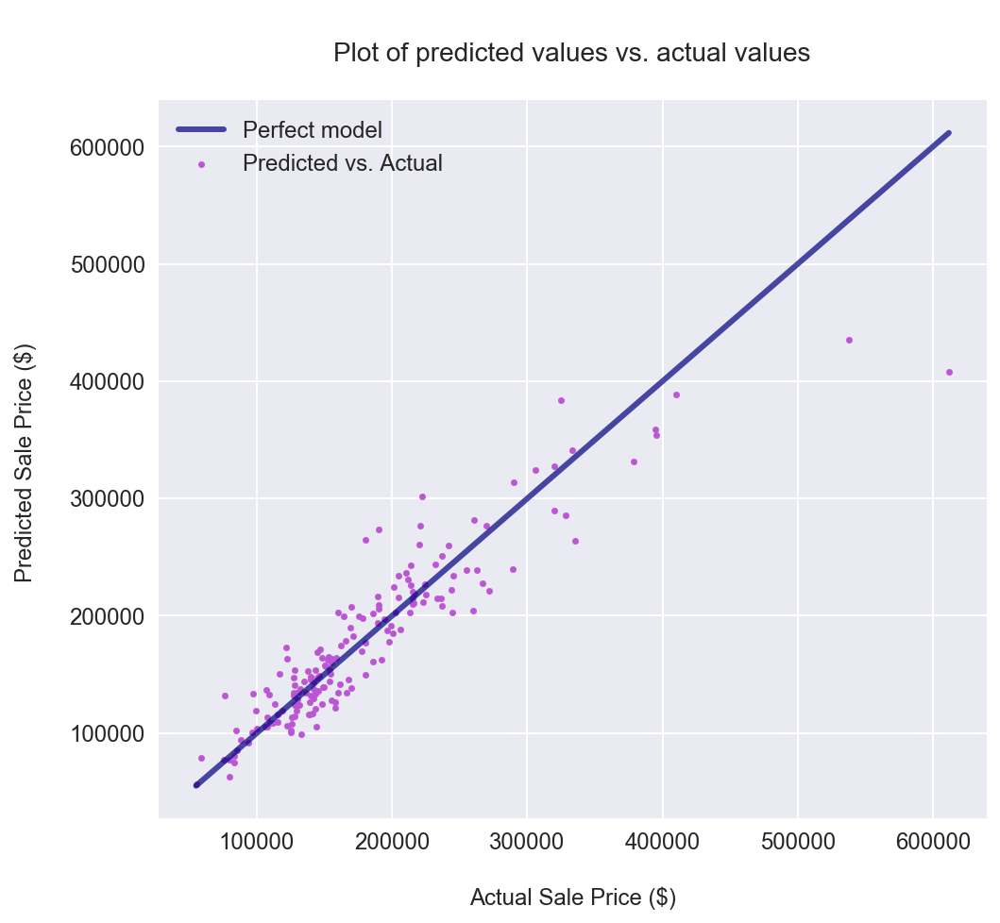

In [122]:
# Plot the predictions vs the Actuals to see relationship
# In a perfect model, all the points would be on the line x=y
yhat = lnr.predict(X_test_ss)
plot_y_yhat(y_test, yhat)

In [124]:
yhat


array([139280.200366  , 153926.02182474, 144116.91415315, 324129.51677842,
       178654.99812725, 132898.74843942, 289732.75343579, 108748.55517783,
       132139.58678871, 265013.1699323 ,  76827.26498405, 147356.42404045,
       113385.89980021, 134255.14078314,  74722.24071937, 123969.83117267,
       215311.68536866, 197671.7004517 , 191338.34148343, 206123.39066123,
       176984.35344049, 327572.40208021, 109769.91223273, 134382.10075306,
       211446.64468691, 276782.18028474, 238991.99192405, 260399.81535554,
       220227.22527617, 147755.77965774, 160656.1605742 , 141274.77662854,
       100548.41573118, 124430.05950262, 140665.442901  , 219132.78644395,
       201722.61476598, 197268.96304603, 124658.85740155, 238603.4713065 ,
       234104.8763929 , 131986.26972622, 135662.37982463, 129055.87706505,
       313428.12887711, 224850.93500924, 116334.23056934, 105826.46932186,
       260104.71189457, 202579.33838931,  85363.63501346, 105055.30218883,
       137867.75557209, 1

Model looks pretty good.  There are a couple of sales with high values that aren't represented well by the model, and have signicant residuals.  

In [112]:
pd.DataFrame(yhat, columns=['Predicted Sales Price']).describe()

,Predicted Sales Price
count,172.000000
mean,177709.158772
std,71310.039612
min,56032.862008
25%,126408.539995
50%,160383.611872
75%,215024.121219
max,435397.799578


In [113]:
# Take a look at the residuals from this model
df = pd.DataFrame({'true':y_test,'predictions':yhat})
df['residuals'] = df['true'] - df['predictions']
df.sort_values('residuals',inplace=True,ascending=False)
df.head(10)

,predictions,true,residuals
891,407626.291363,611657,204030.708637
763,435397.799578,538000,102602.200422
1300,263843.414150,335000,71156.585850
1261,204388.967684,260000,55611.032316
535,221302.120988,272000,50697.879012
499,239434.752413,289000,49565.247587
1258,331619.366373,378500,46880.633627
1056,285990.896483,328000,42009.103517
979,353836.450153,395192,41355.549847
931,203086.925252,244400,41313.074748


In [114]:
df.tail(10)

,predictions,true,residuals
159,260399.815356,220000,-40399.815356
1406,163679.817608,122500,-41179.817608
1386,202836.647827,160000,-42836.647827
555,173134.404551,121500,-51634.404551
247,131986.269726,76500,-55486.269726
679,276707.855755,221000,-55707.855755
1096,383409.046845,325000,-58409.046845
409,302084.640025,222000,-80084.640025
1312,273794.341698,190000,-83794.341698
65,265013.169932,180000,-85013.169932


In [115]:
df['residual_squared'] = df['residuals']**2

In [116]:
# Sum R2 and find the mean to cross-validate the result with the MSE calculated above
sum(df['residuals']**2)/len(df)

921904784.7847159

##### KFold Cross Validation

In [117]:
# Find the best linear model for my training data
# Define a function to model data using KFold cross validation
def model_data(fold_number):
    lnr1 = LinearRegression()
    scores = cross_val_score(lnr1, X_train_ss, y_train, 
                             cv=KFold(n_splits=fold_number, shuffle=True, random_state=1))
    print('Number of folds: ', fold_number)
    print('Cross validated R2 scores:', scores)
    print('Mean of R2 scores:',scores.mean())
    print('Standard Deviation of R2 scores:', np.std(scores))
    print('--------------------------------------\n\n')      

In [118]:
# Look at R2 scores for models with a range of 3-10 folds
for fold_number in range(3,11):
    model_data(fold_number)

Number of folds:  3
Cross validated R2 scores: [ 7.94369597e-01 -7.13282786e+23  8.20818448e-01]
Mean of R2 scores: -2.377609288023051e+23
Standard Deviation of R2 scores: 3.3624473011464376e+23
--------------------------------------


Number of folds:  4
Cross validated R2 scores: [ 7.69266268e-01 -2.43577534e+23  8.09175459e-01  8.23123336e-01]
Mean of R2 scores: -6.0894383519130244e+22
Standard Deviation of R2 scores: 1.0547216615071848e+23
--------------------------------------


Number of folds:  5
Cross validated R2 scores: [ 7.67239231e-01  8.45032805e-01 -6.19987449e+20  8.23019112e-01
  8.25036548e-01]
Mean of R2 scores: -1.2399748981739941e+20
Standard Deviation of R2 scores: 2.4799497963479882e+20
--------------------------------------


Number of folds:  6
Cross validated R2 scores: [ 7.42861668e-01  8.57360718e-01 -7.59685155e+22  8.14981379e-01
  7.82995516e-01  8.63168524e-01]
Mean of R2 scores: -1.2661419247527195e+22
Standard Deviation of R2 scores: 2.8311794129095046e

For the range of different folds, I've achieved reasonable R2 scores, however there is 1 HUGE(!!!) negative score
in each of the calculations, resulting in a large negative mean R2 score and a large standard deviation of R2 scores.



###### Investigation into large, negative R2 score

In [119]:
# Review predictions for Linear Regression model with n_splits=5
lnr1 = LinearRegression()
cross_val_predictions = cross_val_predict(lnr1, X_train_ss, y_train, 
                                          cv=KFold(n_splits=5, shuffle=True, random_state=1))
pd.DataFrame(cross_val_predictions, columns=['Predicted Sales Price']).describe()

,Predicted Sales Price
count,1.278000e+03
mean,-2.505635e+13
std,8.957425e+14
min,-3.202201e+16
25%,1.287744e+05
50%,1.708726e+05
75%,2.167600e+05
max,6.443538e+05


There is a really large negative(!) prediction.  Note, sometimes there is also a really large positive
predition.  I've applied random_state=1 to the modeling to generate reproducible results for this project.

In [120]:
sp_predictions = pd.DataFrame({'true':y_train,'predictions':cross_val_predictions})
sp_predictions['residuals'] = sp_predictions['true'] - sp_predictions['predictions']
sp_predictions.sort_values('residuals', inplace=True, ascending=False)
sp_predictions.head(10)

,predictions,true,residuals
940,-3.202201e+16,192500,3.202201e+16
1173,4.997378e+05,745000,2.452622e+05
686,5.171493e+05,755000,2.378507e+05
182,2.760637e+05,475000,1.989363e+05
797,4.113275e+05,582933,1.716055e+05
1038,3.919306e+05,556581,1.646504e+05
175,3.492817e+05,501837,1.525553e+05
1160,4.850724e+05,625000,1.399276e+05
683,2.574825e+05,392000,1.345175e+05
437,4.354030e+05,555000,1.195970e+05


In [121]:
sp_predictions.tail(10)

,predictions,true,residuals
4,333037.522745,250000,-83037.522745
661,216395.101845,129000,-87395.101845
1302,398565.580843,302000,-96565.580843
1430,288289.076809,191000,-97289.076809
627,180575.214844,82500,-98075.214844
576,353605.797438,253293,-100312.797438
315,361424.135904,260000,-101424.135904
1314,317063.167969,147000,-170063.167969
519,489807.875831,184750,-305057.875831
1288,644353.832004,160000,-484353.832004


There is 1 house with a very large negative(!) prediction (index=940) and 2 houses that are very poorly represented by the model (indexes 519 and 1288), which have very large residuals as a result.  

Note, I don't experience this issue with the model that is not cross validated.  Not sure why this occurs for the 
cross validated model only.  Perhaps the model is overfitted, resulting in high variance?

In [122]:
sp_predictions.describe()

,predictions,true,residuals
count,1.278000e+03,1278.000000,1.278000e+03
mean,-2.505635e+13,181989.782473,2.505635e+13
std,8.957425e+14,79095.208573,8.957425e+14
min,-3.202201e+16,37900.000000,-4.843538e+05
25%,1.287744e+05,130000.000000,-1.508717e+04
50%,1.708726e+05,164945.000000,-2.109469e+00
75%,2.167600e+05,214375.000000,1.400695e+04
max,6.443538e+05,755000.000000,3.202201e+16


In [123]:
# Look at these houses 
house.ix[939:941, predictors_all + ['SalePrice']]

/Users/Matt/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood,LotShape,Condition1,BldgType,HouseStyle,Foundation,BsmtQual,BsmtExposure,GarageType,SalePrice
939,2003,1616,1629,2,3,1,0,252,Timber,Reg,Norm,1Fam,1Story,PConc,Gd,Av,Attchd,270000
940,2002,936,1776,2,2,1,144,96,CollgCr,IR1,Norm,1Fam,2Story,PConc,Gd,NA,Attchd,192500
941,2006,1161,1381,1,2,1,0,0,NWAmes,Reg,Norm,1Fam,1Story,CBlock,TA,No,Attchd,197500


In [124]:
house.ix[1287:1289, predictors_all + ['SalePrice']]

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood,LotShape,Condition1,BldgType,HouseStyle,Foundation,BsmtQual,BsmtExposure,GarageType,SalePrice
1287,2006,547,1072,2,2,0,0,44,Edwards,Reg,Norm,TwnhsE,SFoyer,PConc,Gd,Gd,Basment,140000
1288,2008,6110,5642,2,2,3,214,292,Edwards,IR3,Feedr,1Fam,2Story,PConc,Ex,Gd,Attchd,160000
1289,1994,1246,1246,1,1,0,218,0,NAmes,Reg,Norm,1Fam,1Story,CBlock,TA,No,Attchd,154000


In [125]:
house.ix[518:520, predictors_all + ['SalePrice']]

,YearRemodAdd,TotalBsmtSF,GrLivArea,FullBath,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,Neighborhood,LotShape,Condition1,BldgType,HouseStyle,Foundation,BsmtQual,BsmtExposure,GarageType,SalePrice
518,1950,1004,1664,2,2,2,0,24,BrkSide,Reg,Feedr,1Fam,1.5Fin,CBlock,TA,No,Detchd,159000
519,2008,3138,4676,3,3,1,208,406,Edwards,IR1,PosN,1Fam,2Story,PConc,Ex,Gd,BuiltIn,184750
520,1997,1379,2398,2,3,1,239,60,NoRidge,IR1,Norm,1Fam,2Story,PConc,Gd,No,Attchd,315750


I can't see anything in the data related to these 3 houses that has driven the strange sales price predictions (and large residuals) for them.  
Further more, they are not at the extremes of the sales price range - so I remain confused as to why my model is performing so poorly on these 3 houses.

In [126]:
# Drop index 940 (house with the huge negtive prediction) to enable me to plot actual 
# and predicted values for the training data on a chart
sp_predictions.drop(labels=940, inplace=True)


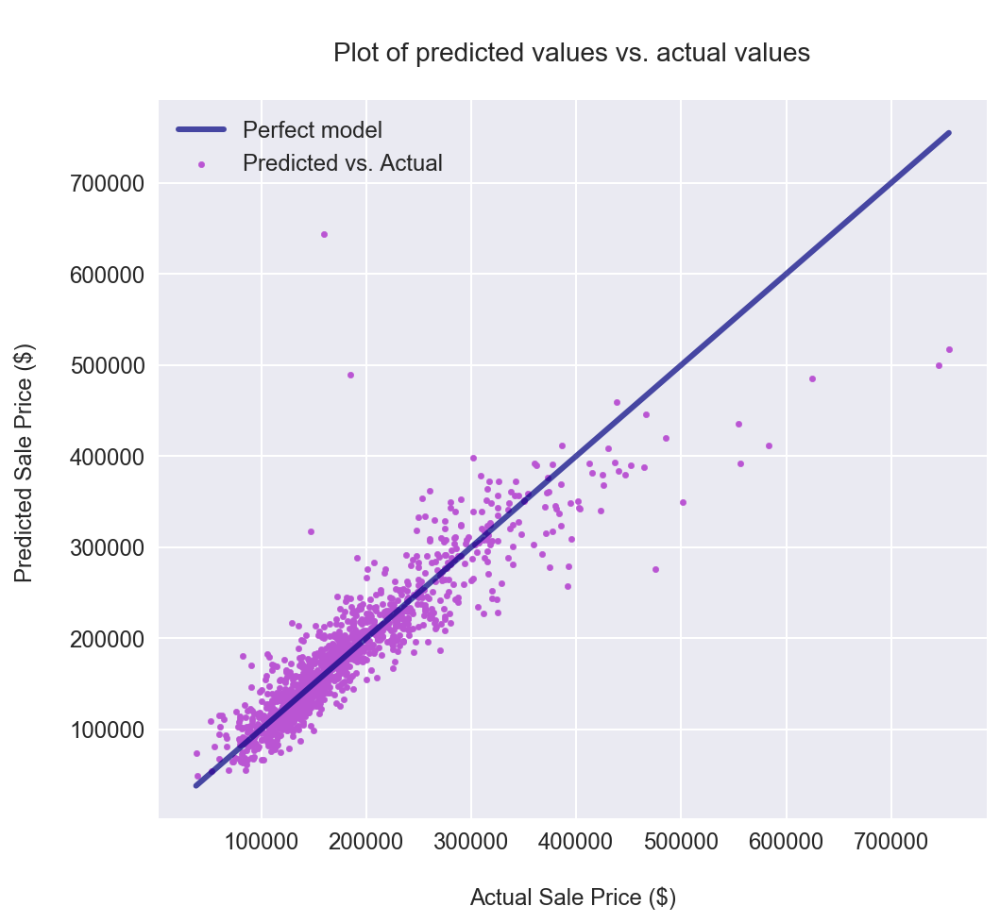

In [127]:
plot_y_yhat(sp_predictions['true'], sp_predictions['predictions'])

There are a number of data points with significant residuals.  Will regularise the model to see if this reduces overfitting, and hence variance

##### Regularisation

###### Ridge

In [128]:
# Can I improve on the model with regularisation?
# Given the relatively small size of the dataset, I'm going to use 3 folds only
ridge_alphas = np.logspace(-3,5,100)
ridge = RidgeCV(alphas=ridge_alphas, cv=3)
ridge.fit(X_train_ss, y_train)

print('Optimal Ridge R2 score:', round(ridge.score(X_train_ss, y_train),3))
print('Best alpha:', round(ridge.alpha_,3))

Optimal Ridge R2 score: 0.84
Best alpha: 84.975


In [129]:
# Using the best alpha, cross validate the training data and print the mean R2 score
optimum_ridge = Ridge(alpha = ridge.alpha_)
print(f'Mean R2 score for optimal Ridge cross validation:', 
      round(np.mean(cross_val_score(optimum_ridge, X_train_ss, y_train, cv=3)),3))

Mean R2 score for optimal Ridge cross validation: 0.801


This mean R2 score is a significant improvement on the linear regression cross validation R2 score.
There is likely too much multicollinearity between the predictors - I'm assuming this exists between the 
dummified categorical predictors, which I didn't look for as I did with the numeric predictors - 
and the 'vanilla' regression has overfit and has bogus predictor coefficients.

In [130]:
# Fit optimum ridge on training data, and test it on the testing data
optimum_ridge.fit(X_train_ss, y_train)
print('R2 score of optimum Ridge on test data:', round(optimum_ridge.score(X_test_ss,y_test),3))

R2 score of optimum Ridge on test data: 0.852


###### Lasso

Perhaps the model has too many predictors.  Let's try Lasso regularisation.

In [131]:
# Perform a lasso regularisation
lasso = LassoCV(n_alphas=100, cv=3)
lasso.fit(X_train_ss, y_train)

print('Optimal Lasso R2 score:', round(lasso.score(X_train_ss, y_train),3))
print('Best alpha:', round(lasso.alpha_,3))

Optimal Lasso R2 score: 0.84
Best alpha: 559.941


In [132]:
# Using the best alpha, cross validate the training data and print the mean R2 score
optimum_lasso = Lasso(alpha = lasso.alpha_)
print(f'Mean R2 score for optimal Lasso cross validation:', 
      round(np.mean(cross_val_score(optimum_lasso, X_train_ss, y_train, cv=3)),3))

Mean R2 score for optimal Lasso cross validation: 0.801


In [133]:
# Fit optimum lasso on training data, and test it on the testing data
optimum_lasso.fit(X_train_ss, y_train)
print('R2 score of optimum Lasso on test data:', round(optimum_lasso.score(X_test_ss, y_test),3))

R2 score of optimum Lasso on test data: 0.854


The Lasso performs very similar to the Ridge

In [134]:
# Look at the predictor coefficients in the Lasso
lasso_coeffs = pd.DataFrame({'variable': X_dumified.columns,
                             'coef': optimum_lasso.coef_,
                             'abs_coef': np.abs(optimum_lasso.coef_)})

lasso_coeffs.sort_values('abs_coef', inplace=True, ascending=False)

In [135]:
# Look at 10 most important/largest coefficients
lasso_coeffs.head(10)

,abs_coef,coef,variable
2,27268.081867,27268.081867,GrLivArea
62,19275.007755,-19275.007755,BsmtQual_TA
60,17413.818363,-17413.818363,BsmtQual_Gd
23,12536.035123,12536.035123,Neighborhood_NridgHt
22,11065.696639,11065.696639,Neighborhood_NoRidge
4,10037.814480,10037.814480,GarageCars
0,8584.264065,8584.264065,YearRemodAdd
29,8496.772899,8496.772899,Neighborhood_StoneBr
59,6868.987980,-6868.987980,BsmtQual_Fa
28,6636.704823,6636.704823,Neighborhood_Somerst


The 2 numerical predictors with the highest correlation with sales price (GrLivArea and GarageCars) also turn out to be the 2 most significant numeric predictors from a coefficient perceptive.

In [136]:
# Look at 10 least important/smallest coefficients
lasso_coeffs.tail(10)

,abs_coef,coef,variable
54,0.0,0.0,Foundation_CBlock
51,0.0,-0.0,HouseStyle_2Story
50,0.0,-0.0,HouseStyle_2.5Unf
19,0.0,-0.0,Neighborhood_NAmes
21,0.0,0.0,Neighborhood_NWAmes
42,0.0,0.0,Condition1_RRNn
41,0.0,0.0,Condition1_RRNe
40,0.0,0.0,Condition1_RRAn
37,0.0,0.0,Condition1_PosA
72,0.0,0.0,GarageType_NA


As expected, the Lasso has zeroed out some of my predictor coefficients.

In [137]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(optimum_lasso.coef_ == 0)/float(X_dumified.shape[1])) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 24.66%.


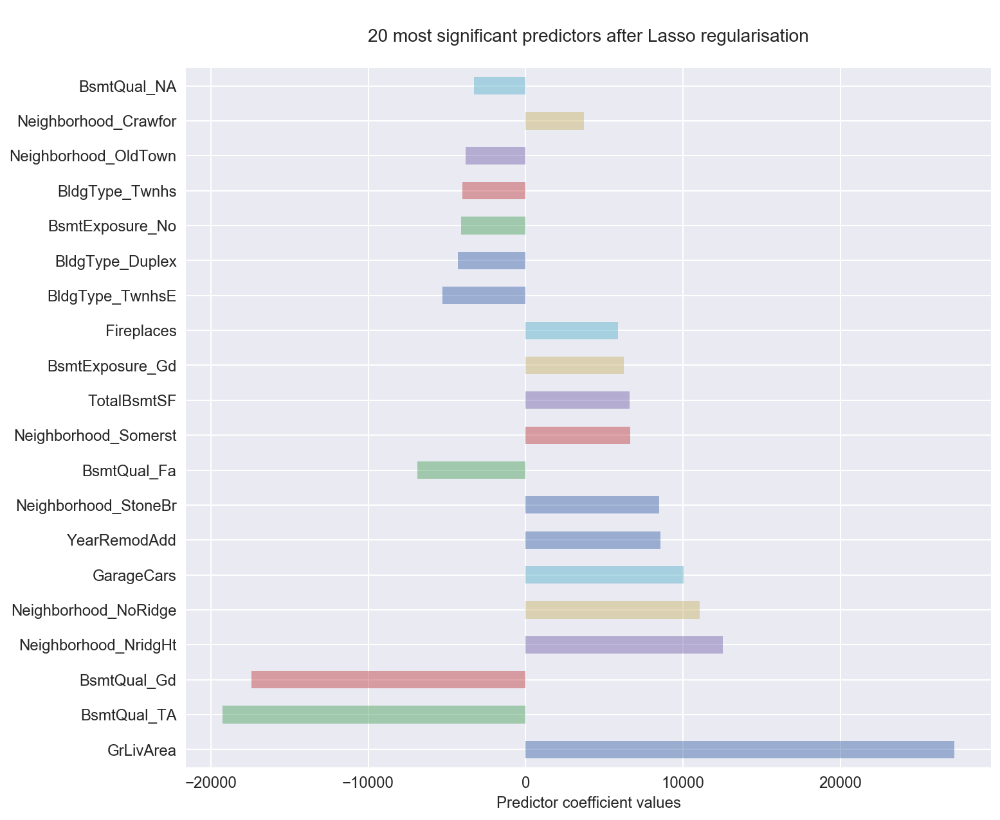

In [138]:
# Plot 20 largest coefficients
fig, ax = plt.subplots(figsize=(10,10))
title = '\n20 most significant predictors after Lasso regularisation\n'
lasso_coeffs.coef[:20].plot(kind='barh', ax=ax, alpha=0.5, fontsize=12)
ax.set_yticklabels(lasso_coeffs.variable[:20].values)
ax.set_xlabel('Predictor coefficient values', fontsize=12)
ax.set_title(title, fontsize=14);


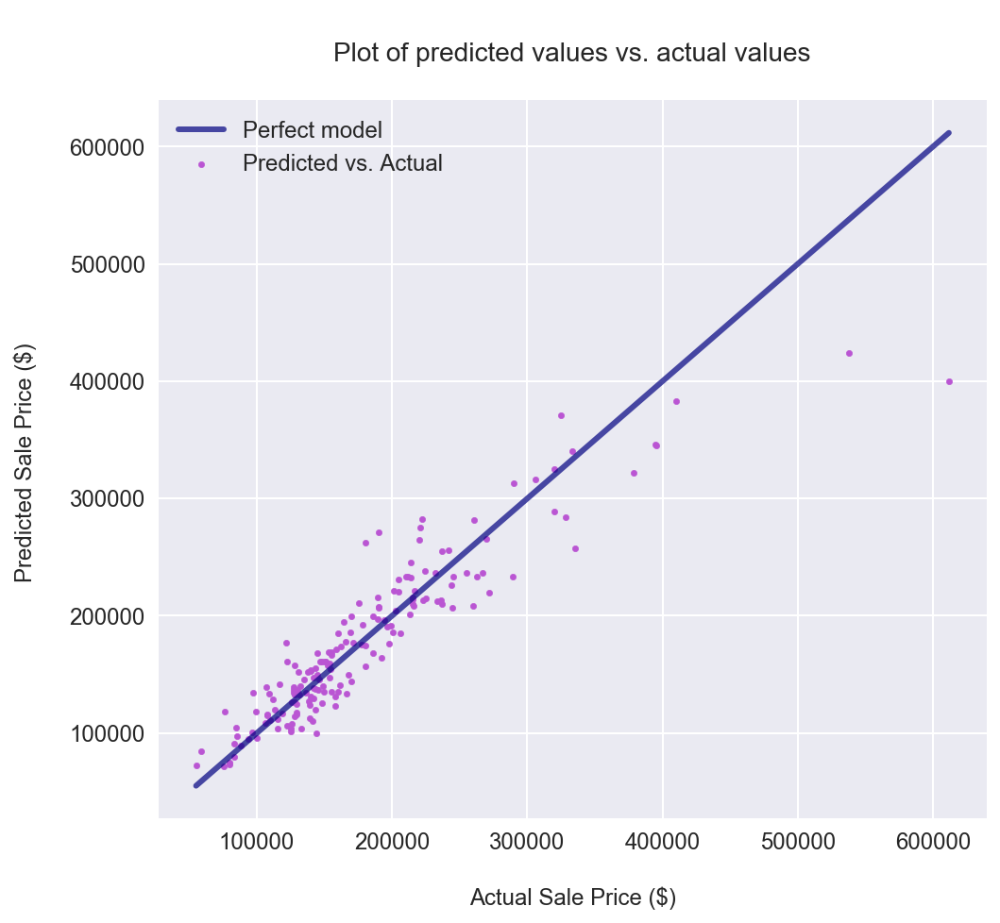

In [139]:
# Plot predictions for test data from optimim lasso model vs actual sale prices
predictions = optimum_lasso.predict(X_test_ss)
plot_y_yhat(y_test, predictions)

The model performs well on the test set, apart from 2 data points at the upper extreme of the sales price range.

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovatable features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

### EDA

#### Model predicted prices and review residuals

In [140]:
# Define copy of house data
house_reno = house.copy()

In [141]:
# To the reno_df, add the predicted price as modeled by the optimimum lasso regularisation above in 1.6.2.3

# Re-standardise all data in dummified predictors matrix based on mean and std of X_train data
# This standardised predictor data will then be used as the basis for predicting all sales prices using 
# the optimum Lasso model in 1.6.2.3
ss = StandardScaler()
ss.fit(X_train)
X_ss = ss.transform(X_dumified)

# Insert predicted prices and based on fixed features and residuals
house_reno['Predicted SalePrice'] = optimum_lasso.predict(X_ss)
house_reno['Residuals'] = house_reno['SalePrice'] - house_reno['Predicted SalePrice']

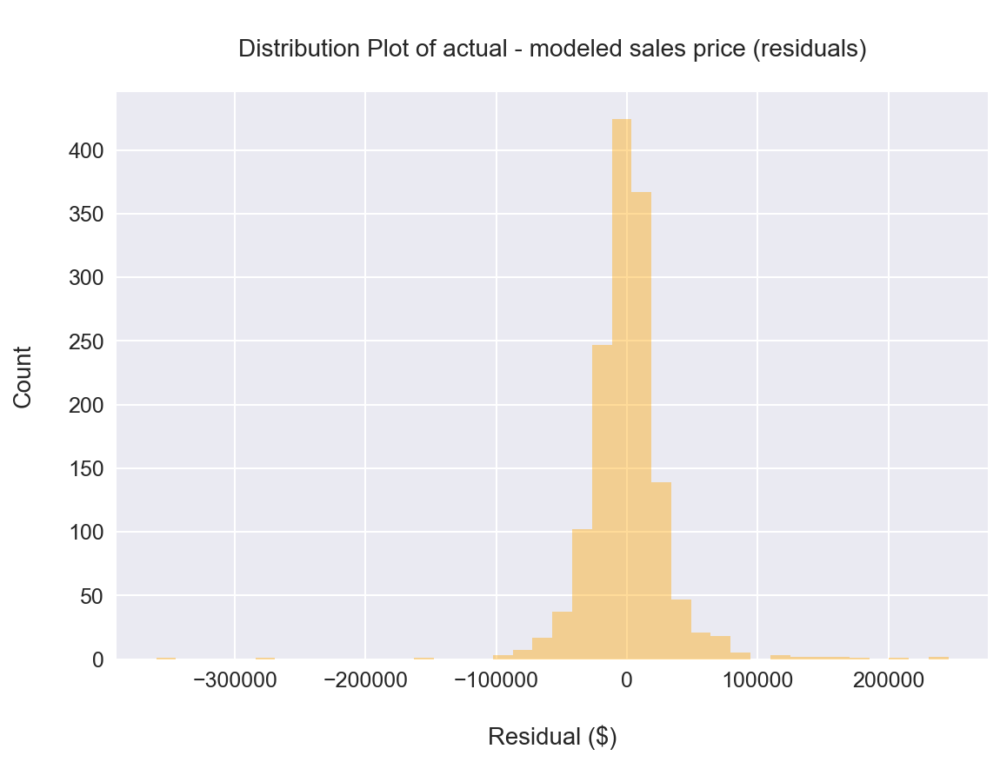

In [142]:
# Plot distribution plot of ALL Sales Price residuals
sns.set(font_scale=1.25)
fig = plt.figure(figsize=(8,6))
ax = fig.gca()

ax = sns.distplot(house_reno['Residuals'], kde=False, bins=40, color='orange')

ax.set_title('\nDistribution Plot of actual - modeled sales price (residuals)\n', fontsize=14)
ax.set_xlabel('\nResidual ($)')
ax.set_ylabel('Count\n') ;
 

In [143]:
# Residuals appear normally distributed, as expected.

# Test if the sum of the residuals for the train data is 0
print(f"Sum of residuals for training data is: \
${house_reno.loc[house_reno['YrSold']<2010,'Residuals'].sum()}.")


Sum of residuals for training data is: $-2.4156179279088974e-08.


Sum of residuals for train data is 0, as expected.  

I wouldn't expect the sum of residuals for my test data, or the sum of residuals 
for all predicted prices to be 0, as the model was not trained on all this data 
and the model is an imperfect fit for the test data.

In [144]:
print(f"Sum of residuals for test data is: \
${round(house_reno.loc[house_reno['YrSold']==2010,'Residuals'].sum(),2)}.")

print(f"Mean of residuals for test data is: \
${round(house_reno.loc[house_reno['YrSold']==2010,'Residuals'].mean(),2)}.")

Sum of residuals for test data is: $238297.85.
Mean of residuals for test data is: $1385.45.


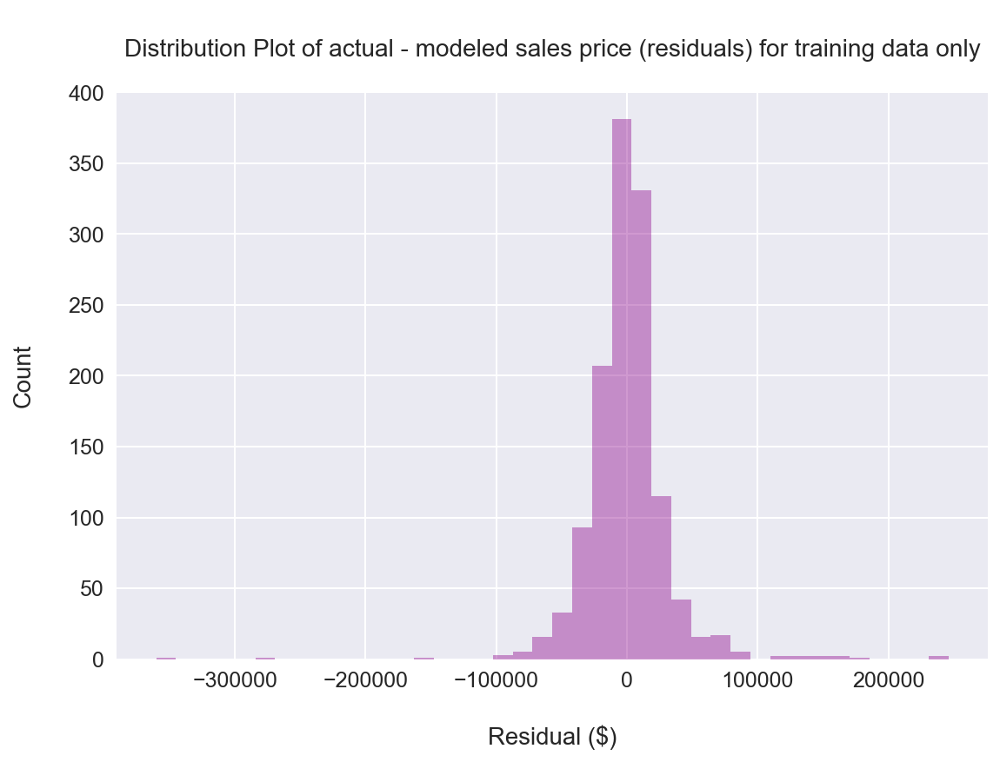

In [145]:
# Plot distribution plot of Sales Price residuals for training data only
sns.set(font_scale=1.25)
fig = plt.figure(figsize=(8,6))
ax = fig.gca()

ax = sns.distplot(house_reno.loc[house_reno['YrSold']<2010,'Residuals'], 
                  kde=False, bins=40, color='darkmagenta')

ax.set_title('\nDistribution Plot of actual - modeled sales price (residuals) \
for training data only\n', fontsize=14)
ax.set_xlabel('\nResidual ($)')
ax.set_ylabel('Count\n') ;

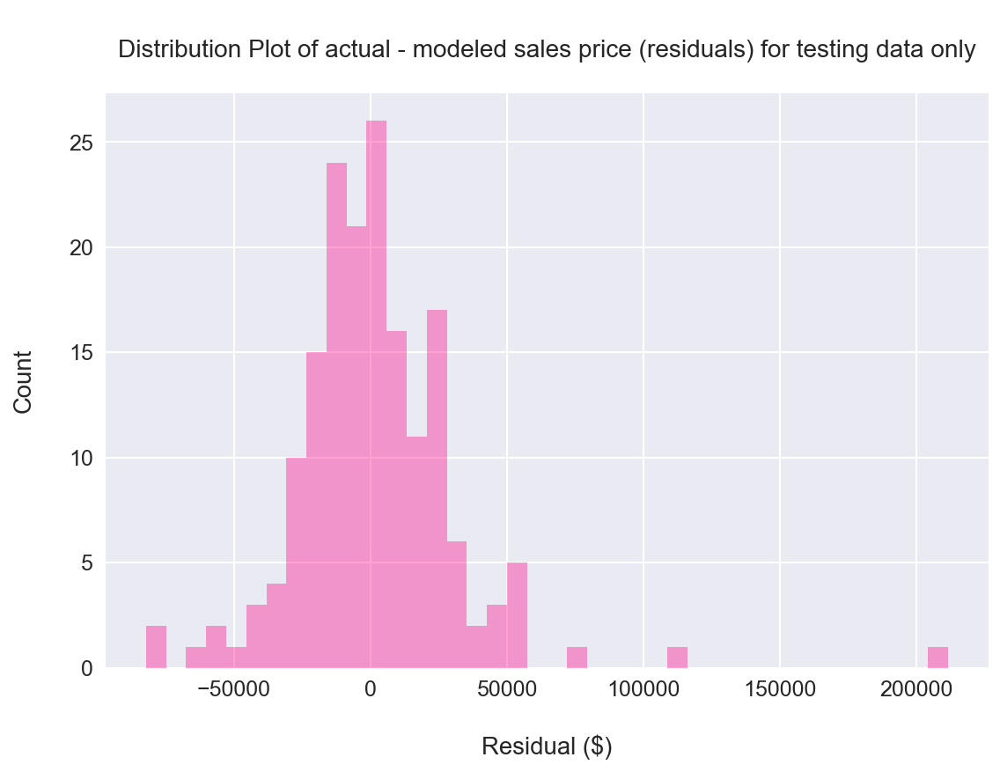

In [146]:
# Plot distribution plot of Sales Price residuals for testing data only
sns.set(font_scale=1.25)
fig = plt.figure(figsize=(8,6))
ax = fig.gca()

ax = sns.distplot(house_reno.loc[house_reno['YrSold']==2010,'Residuals'], 
                  kde=False, bins=40, color='deeppink')

ax.set_title('\nDistribution Plot of actual - modeled sales price (residuals) \
for testing data only\n', fontsize=14)
ax.set_xlabel('\nResidual ($)')
ax.set_ylabel('Count\n') ;

In [147]:
house_reno['Residuals'].describe()

count      1450.000000
mean        164.343347
std       31523.371119
min     -360126.959778
25%      -14112.742794
50%         -55.462763
75%       12293.497789
max      246089.540553
Name: Residuals, dtype: float64

#### Subset Data on renovateable features

In [148]:
print(col_indexes)


{0: 'Id', 1: 'MSSubClass', 2: 'MSZoning', 3: 'LotFrontage', 4: 'LotArea', 5: 'Street', 6: 'Alley', 7: 'LotShape', 8: 'LandContour', 9: 'Utilities', 10: 'LotConfig', 11: 'LandSlope', 12: 'Neighborhood', 13: 'Condition1', 14: 'Condition2', 15: 'BldgType', 16: 'HouseStyle', 17: 'OverallQual', 18: 'OverallCond', 19: 'YearBuilt', 20: 'YearRemodAdd', 21: 'RoofStyle', 22: 'RoofMatl', 23: 'Exterior1st', 24: 'Exterior2nd', 25: 'MasVnrType', 26: 'MasVnrArea', 27: 'ExterQual', 28: 'ExterCond', 29: 'Foundation', 30: 'BsmtQual', 31: 'BsmtCond', 32: 'BsmtExposure', 33: 'BsmtFinType1', 34: 'BsmtFinSF1', 35: 'BsmtFinType2', 36: 'BsmtFinSF2', 37: 'BsmtUnfSF', 38: 'TotalBsmtSF', 39: 'Heating', 40: 'HeatingQC', 41: 'CentralAir', 42: 'Electrical', 43: '1stFlrSF', 44: '2ndFlrSF', 45: 'LowQualFinSF', 46: 'GrLivArea', 47: 'BsmtFullBath', 48: 'BsmtHalfBath', 49: 'FullBath', 50: 'HalfBath', 51: 'BedroomAbvGr', 52: 'KitchenAbvGr', 53: 'KitchenQual', 54: 'TotRmsAbvGrd', 55: 'Functional', 56: 'Fireplaces', 57: 'F

In [149]:
# The column indexes I've previously considered as fixed features are stored in the 2 lists below
# These should not be considered as potential predictors of the residuals, and I'm going to 
# drop these from the predictors matrix to simplify it
cat_cols_to_eda = [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 29, 30, 32, 58, 65]
ff_col_index.remove(80)    # Retain sales price in predictor matrix
ff_col_index.remove(77)    # Retain year sold in predictor matrix as this will be required for train-test split

# Conacatenate fixed features list and review
all_ff_col_indexes = ff_col_index + cat_cols_to_eda
print(all_ff_col_indexes)

[3, 4, 19, 20, 26, 34, 36, 37, 38, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 56, 61, 62, 66, 67, 68, 69, 70, 71, 75, 76, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 29, 30, 32, 58, 65]


In [150]:
# Define list of column names already considered as fixed features (in the all_ff_col_index list)
# These will be dropped from the predictor matrix for the remaining analysis
all_ff_col_names = [col_indexes[key] for key in all_ff_col_indexes]
print(all_ff_col_names)

['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType', 'PavedDrive']


In [151]:
# Remove fixed feature columns from house_reno df as these won't be considered in the model of residuals
print(house_reno.shape)
house_reno.drop(columns=all_ff_col_names, axis=1, inplace=True)
print(house_reno.shape)

(1450, 83)
(1450, 35)


In [152]:
house_reno.head()

,Id,MSSubClass,MSZoning,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature,YrSold,SaleType,SaleCondition,SalePrice,Predicted SalePrice,Residuals
0,1,60,RL,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,2003.0,RFn,TA,TA,NaN,NaN,NaN,2008,WD,Normal,208500,189972.597824,18527.402176
1,2,20,RL,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,TA,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,1976.0,RFn,TA,TA,NaN,NaN,NaN,2007,WD,Normal,181500,218620.355122,-37120.355122
2,3,60,RL,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,2001.0,RFn,TA,TA,NaN,NaN,NaN,2008,WD,Normal,223500,212356.668918,11143.331082
3,4,70,RL,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,Gd,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,1998.0,Unf,TA,TA,NaN,NaN,NaN,2006,WD,Abnorml,140000,198920.830363,-58920.830363
4,5,60,RL,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,2000.0,RFn,TA,TA,NaN,NaN,NaN,2008,WD,Normal,250000,316047.529049,-66047.529049


In [153]:
# Finally remove columns from DF that aren't renovateable
# Removing: Id, MSSubClass, MSZoning, GarageYrBuilt, MiscFeature, SaleType, SaleCondition
col_indexes_to_remove = [0, 1, 2, 22, 28, 30, 31]
house_reno.drop(house_reno.columns[col_indexes_to_remove], axis=1, inplace=True)

In [154]:
house_reno.head()

,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold,SalePrice,Predicted SalePrice,Residuals
0,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,RFn,TA,TA,NaN,NaN,2008,208500,189972.597824,18527.402176
1,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,TA,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,RFn,TA,TA,NaN,NaN,2007,181500,218620.355122,-37120.355122
2,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NaN,NaN,2008,223500,212356.668918,11143.331082
3,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,Gd,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Unf,TA,TA,NaN,NaN,2006,140000,198920.830363,-58920.830363
4,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NaN,NaN,2008,250000,316047.529049,-66047.529049


In [155]:
house_reno.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 28 columns):
OverallQual            1450 non-null int64
OverallCond            1450 non-null int64
RoofStyle              1450 non-null object
RoofMatl               1450 non-null object
Exterior1st            1450 non-null object
Exterior2nd            1450 non-null object
MasVnrType             1450 non-null object
ExterQual              1450 non-null object
ExterCond              1450 non-null object
BsmtCond               1413 non-null object
BsmtFinType1           1413 non-null object
BsmtFinType2           1412 non-null object
Heating                1450 non-null object
HeatingQC              1450 non-null object
CentralAir             1450 non-null object
Electrical             1449 non-null object
KitchenQual            1450 non-null object
Functional             1450 non-null object
FireplaceQu            769 non-null object
GarageFinish           1371 non-null object
GarageQual      

In [156]:
house_reno.isnull().sum()

OverallQual               0
OverallCond               0
RoofStyle                 0
RoofMatl                  0
Exterior1st               0
Exterior2nd               0
MasVnrType                0
ExterQual                 0
ExterCond                 0
BsmtCond                 37
BsmtFinType1             37
BsmtFinType2             38
Heating                   0
HeatingQC                 0
CentralAir                0
Electrical                1
KitchenQual               0
Functional                0
FireplaceQu             681
GarageFinish             79
GarageQual               79
GarageCond               79
PoolQC                 1443
Fence                  1172
YrSold                    0
SalePrice                 0
Predicted SalePrice       0
Residuals                 0
dtype: int64

#### Data Cleaning

Need to investigate null values in BsmtCond, BsmtFinType1, BsmtFinType2, Electrical, FireplaceQu, 
GarageFinish, GarageQual, GarageCond, PoolQC, Fence columns

As these columns are cleaned in the house_reno DF, I'll also need to replicate this cleaning in the 
house DF, as this will be used for the analysis in Q3.  

In hindsight, I probably shouldn't have split the data into multiple DFs!!!!

In [157]:
print('BsmtCond field: ')
print(house_reno['BsmtCond'].value_counts())
print(house_reno['BsmtCond'].unique())
print('--------------------------------------\n')

print('BsmtFinType1 field: ')
print(house_reno['BsmtFinType1'].value_counts())
print(house_reno['BsmtFinType1'].unique())
print('--------------------------------------\n')

print('BsmtFinType2 field: ')
print(house_reno['BsmtFinType2'].value_counts())
print(house_reno['BsmtFinType2'].unique())
print('--------------------------------------\n')


# Suspect that all null values are the result of these homes not having a basement, in which 
# case the null values can be set to 'NA', in line with the data dictionary. 

BsmtCond field: 
TA    1303
Gd      65
Fa      43
Po       2
Name: BsmtCond, dtype: int64
['TA' 'Gd' nan 'Fa' 'Po']
--------------------------------------

BsmtFinType1 field: 
Unf    424
GLQ    418
ALQ    220
BLQ    147
Rec    130
LwQ     74
Name: BsmtFinType1, dtype: int64
['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' nan 'LwQ']
--------------------------------------

BsmtFinType2 field: 
Unf    1246
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64
['Unf' 'BLQ' nan 'ALQ' 'Rec' 'LwQ' 'GLQ']
--------------------------------------



In [158]:
# Confirm these houses all have no basement (i.e. TotalBsmtSF = 0)
mask = house['BsmtCond'].isnull()
house.loc[mask, 'TotalBsmtSF'].value_counts()

0    37
Name: TotalBsmtSF, dtype: int64

In [159]:
# All these homes have no basement.  
# Set null values in BsmtCond, BsmtFinType1, BsmtFinType2 columns to 'NA'
# As explained above, this needs to be hone in both the house_reno and house DFs
mask =  house_reno['BsmtCond'].isnull()
house_reno.loc[mask,'BsmtCond'] = 'NA'
house_reno.loc[mask,'BsmtFinType1'] = 'NA'
house_reno.loc[mask,'BsmtFinType2'] = 'NA'
house.loc[mask,'BsmtCond'] = 'NA'
house.loc[mask,'BsmtFinType1'] = 'NA'
house.loc[mask,'BsmtFinType2'] = 'NA'

In [160]:
# Still 1 null value in BsmtFinType2
mask = house_reno['BsmtFinType2'].isnull()
house_reno.loc[mask,'BsmtFinType2'] = 'NA'
house.loc[mask,'BsmtFinType2'] = 'NA'

In [161]:
# Clean Eletrical column
mask = house_reno['Electrical'].isnull()
house_reno.loc[mask,:]

,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold,SalePrice,Predicted SalePrice,Residuals
1369,5,5,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,TA,Unf,Unf,GasA,Gd,Y,NaN,Gd,Typ,NaN,Fin,TA,TA,NaN,NaN,2008,167500,171888.616253,-4388.616253


In [162]:
house_reno['Electrical'].value_counts()

# Assign value to majority value count
house_reno.loc[mask, 'Electrical'] = 'SBrkr'
house.loc[mask, 'Electrical'] = 'SBrkr'


In [163]:
# Clean FireplaceQu column
mask = house['FireplaceQu'].isnull()
house['FireplaceQu'].unique()
house.loc[mask, 'Fireplaces'].unique()

array([0])

In [164]:
# All homes with null value for FireplaceQu have 0 fireplace.  
# Set these values to NA, as per data dictionary
mask = house_reno['FireplaceQu'].isnull()
house_reno.loc[mask, 'FireplaceQu'] = 'NA'
house.loc[mask, 'FireplaceQu'] = 'NA'

In [165]:
# Suspect the same is happening for GarageFinish, GarageQual, GarageCond columns
mask = house['GarageFinish'].isnull()
print(house.loc[mask, 'GarageQual'].unique())
print(house.loc[mask, 'GarageCond'].unique())

[nan]
[nan]


In [166]:
mask = house_reno['GarageFinish'].isnull()
house_reno.loc[mask, 'GarageFinish'] = 'NA'
house_reno.loc[mask, 'GarageQual'] = 'NA'
house_reno.loc[mask, 'GarageCond'] = 'NA'
house.loc[mask, 'GarageFinish'] = 'NA'
house.loc[mask, 'GarageQual'] = 'NA'
house.loc[mask, 'GarageCond'] = 'NA'

In [167]:
# Supect same thing is happening for null values in PoolQC column
mask = house['PoolQC'].isnull()
house.loc[mask, 'PoolArea'].unique()

array([0])

In [168]:
# Yes, all homes with null values for PoolQC don't have a pool.  Set PoolQC to 'NA' as per data dictionary
mask = house_reno['PoolQC'].isnull()
house_reno.loc[mask, 'PoolQC'] = 'NA'
house.loc[mask, 'PoolQC'] = 'NA'

In [169]:
# Finally, investigate null values in Fence column
house['Fence'].unique()
# Yes, there are no 'NA' values - just nans.  Convert these to 'NA' as per data dictionary

array([nan, 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

In [170]:
mask = house_reno['Fence'].isnull()
house_reno.loc[mask, 'Fence'] = 'NA'
house.loc[mask, 'Fence'] = 'NA'

In [171]:
house_reno.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 28 columns):
OverallQual            1450 non-null int64
OverallCond            1450 non-null int64
RoofStyle              1450 non-null object
RoofMatl               1450 non-null object
Exterior1st            1450 non-null object
Exterior2nd            1450 non-null object
MasVnrType             1450 non-null object
ExterQual              1450 non-null object
ExterCond              1450 non-null object
BsmtCond               1450 non-null object
BsmtFinType1           1450 non-null object
BsmtFinType2           1450 non-null object
Heating                1450 non-null object
HeatingQC              1450 non-null object
CentralAir             1450 non-null object
Electrical             1450 non-null object
KitchenQual            1450 non-null object
Functional             1450 non-null object
FireplaceQu            1450 non-null object
GarageFinish           1450 non-null object
GarageQual     

In [172]:
house_reno.describe()

,OverallQual,OverallCond,YrSold,SalePrice,Predicted SalePrice,Residuals
count,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,6.114483,5.582069,2007.812414,181654.942069,181490.598722,164.343347
std,1.372860,1.107330,1.326321,79176.485241,70560.040179,31523.371119
min,1.000000,1.000000,2006.000000,37900.000000,46427.716958,-360126.959778
25%,5.000000,5.000000,2007.000000,130000.000000,130610.492596,-14112.742794
50%,6.000000,5.000000,2008.000000,163945.000000,170329.090551,-55.462763
75%,7.000000,6.000000,2009.000000,214000.000000,216953.494951,12293.497789
max,10.000000,9.000000,2010.000000,755000.000000,520126.959778,246089.540553


In [173]:
house_reno.head()

,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtCond,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold,SalePrice,Predicted SalePrice,Residuals
0,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NA,RFn,TA,TA,NA,NA,2008,208500,189972.597824,18527.402176
1,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,TA,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,RFn,TA,TA,NA,NA,2007,181500,218620.355122,-37120.355122
2,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NA,NA,2008,223500,212356.668918,11143.331082
3,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,Gd,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Unf,TA,TA,NA,NA,2006,140000,198920.830363,-58920.830363
4,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,TA,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,RFn,TA,TA,NA,NA,2008,250000,316047.529049,-66047.529049


### Examine numeric, renovateable features

In [174]:
house_reno.corr()

,OverallQual,OverallCond,YrSold,SalePrice,Predicted SalePrice,Residuals
OverallQual,1.000000,-0.107874,-0.024962,0.789031,0.800920,0.189059
OverallCond,-0.107874,1.000000,0.046202,-0.089084,-0.164137,0.143642
YrSold,-0.024962,0.046202,1.000000,-0.025391,-0.028361,-0.000293
SalePrice,0.789031,-0.089084,-0.025391,1.000000,0.917708,0.457532
Predicted SalePrice,0.800920,-0.164137,-0.028361,0.917708,1.000000,0.066645
Residuals,0.189059,0.143642,-0.000293,0.457532,0.066645,1.000000


Both OverallQual and OverallCond have relatively low positive correlations with the Residuals.

### Investigate relationship between categorical variables for renovateable features and the Residuals

In [175]:
# For each categorical variable in the cat_cols_to_eda list, create a box and swarmplot, with the 
# value_counts for each field included in the x-axis label
reno_cat_cols_to_eda = list(house_reno.columns[2:])
reno_cat_cols_to_eda.remove('SalePrice')
reno_cat_cols_to_eda.remove('Predicted SalePrice')
reno_cat_cols_to_eda.remove('YrSold')

/Users/Matt/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


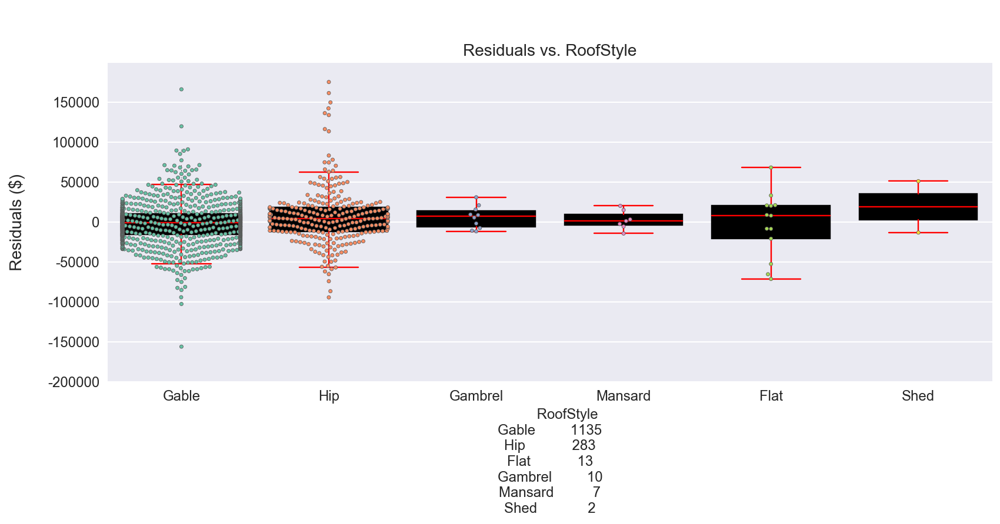

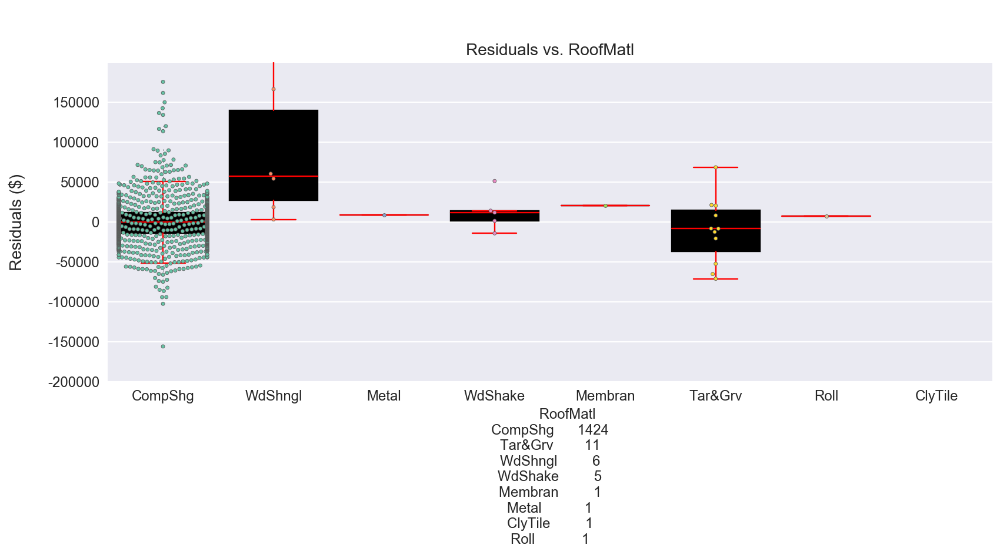

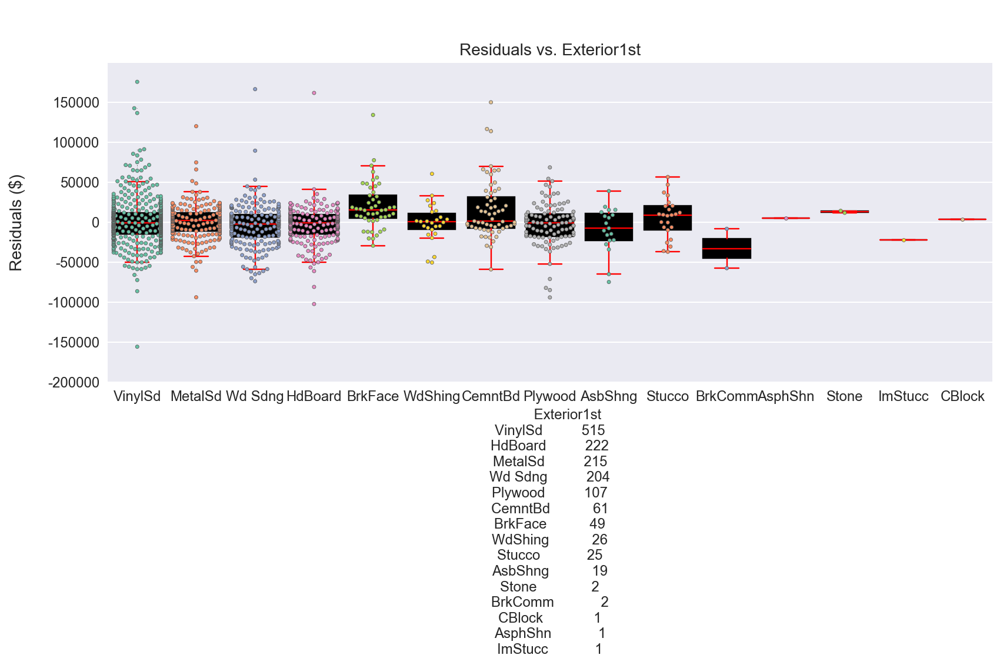

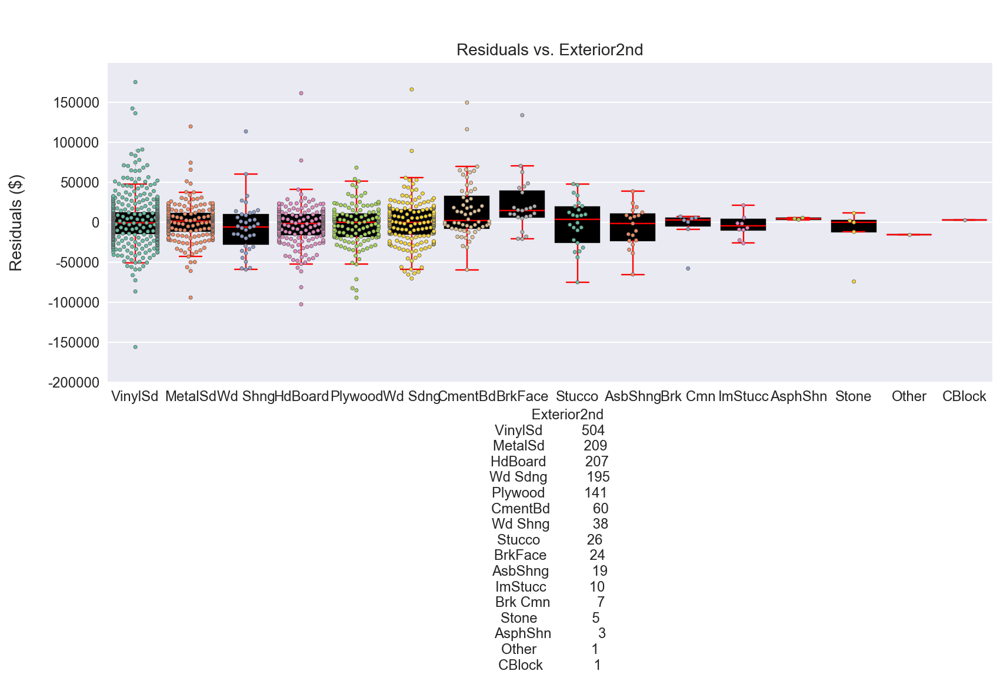

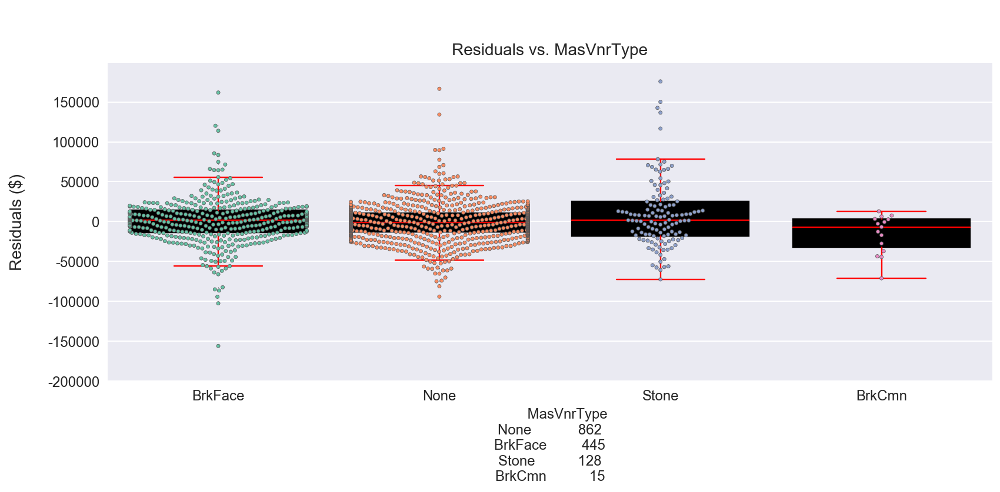

...

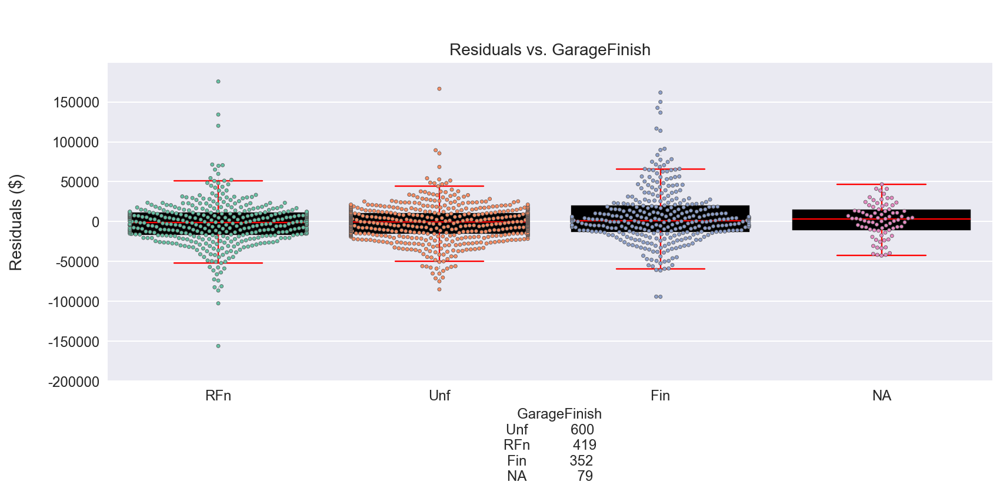

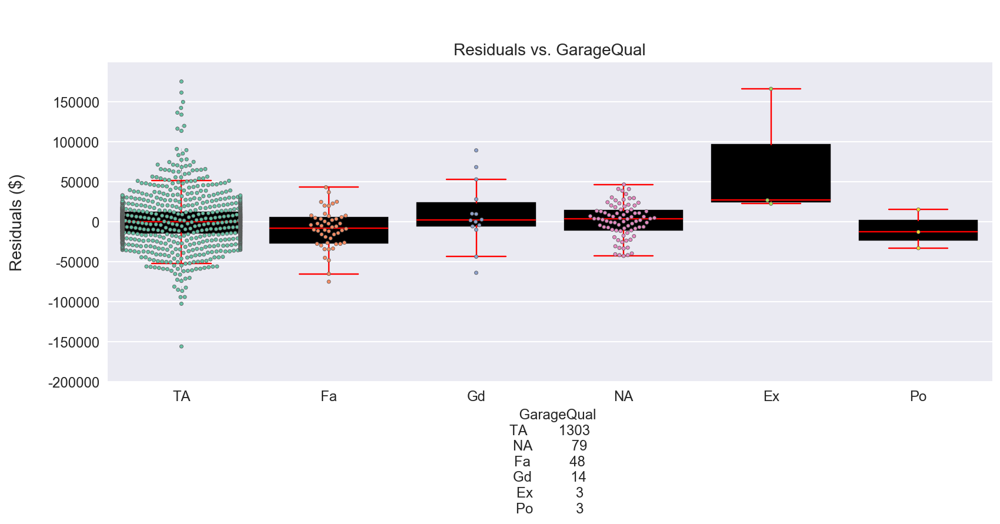

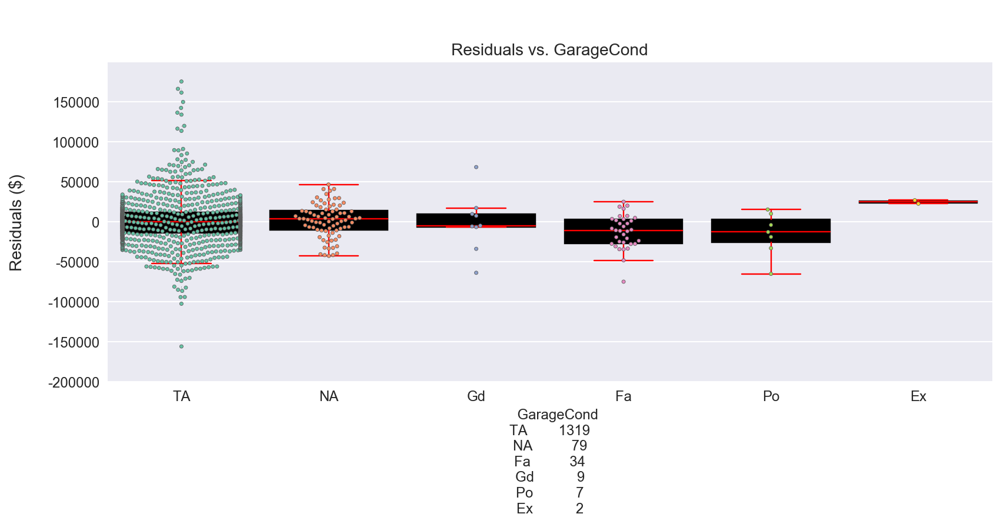

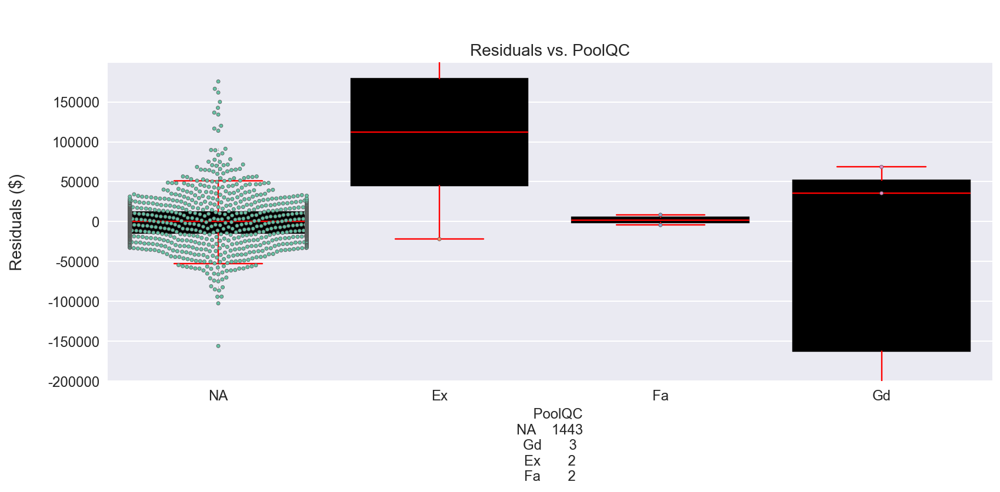

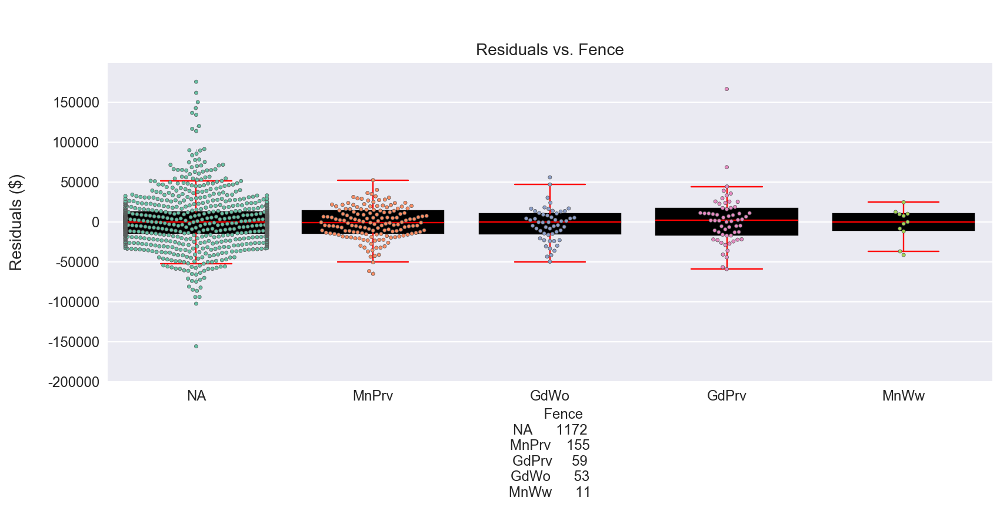

In [176]:
for cat_var in reno_cat_cols_to_eda[:-1]:
    plot_price_boxplot(cat_var, house_reno.loc[:, reno_cat_cols_to_eda], 'Residuals')


As in 1.5.3, I'm looking for categorical variables that demonstrate both: 1) a variation in residuals across their different values, and 2) have a 'reasonable' spread of datapoints across their different values.

There isn't a great deal of variation across these categorical predictors.  The predictors that come closest
to satisfying the 2 criteria above are:
- RoofStyle
- Exterior1st
- Exterior2nd
- BsmtFinType1
- KitchenQual
- Functional
- FirePlaceQual
- GarageQual
- GarageCond

I'm going to include these in my predictor matrix, along with OverallQual and OverallCond.  Even though
the correlation between the residuals and OverallQual and OverallCond is relatively low, it 
feels appropriate that these may contribute to variance/residuals from the predicted sales prices.

### Train and evaluate Linear Regression model to predict sales price residuals

#### Define predictor and target

In [177]:
# Create dictionary look up of column names and indexes from the house_reno df
col_indexes = dict(enumerate(house_reno.columns))
print(col_indexes)

{0: 'OverallQual', 1: 'OverallCond', 2: 'RoofStyle', 3: 'RoofMatl', 4: 'Exterior1st', 5: 'Exterior2nd', 6: 'MasVnrType', 7: 'ExterQual', 8: 'ExterCond', 9: 'BsmtCond', 10: 'BsmtFinType1', 11: 'BsmtFinType2', 12: 'Heating', 13: 'HeatingQC', 14: 'CentralAir', 15: 'Electrical', 16: 'KitchenQual', 17: 'Functional', 18: 'FireplaceQu', 19: 'GarageFinish', 20: 'GarageQual', 21: 'GarageCond', 22: 'PoolQC', 23: 'Fence', 24: 'YrSold', 25: 'SalePrice', 26: 'Predicted SalePrice', 27: 'Residuals'}


In [178]:
# Identify column indexes to include in predictor matrix
predictor_col_indexes = [0, 1, 2, 4, 5, 10, 16, 17, 18, 20, 21]
predictor_col_names = [col_indexes[key] for key in predictor_col_indexes]
print(predictor_col_names)

['OverallQual', 'OverallCond', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'BsmtFinType1', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageQual', 'GarageCond']


In [179]:
# Define predictor matrix and target array
Xr = house_reno[predictor_col_names]
yr = house_reno['Residuals']

In [180]:
# Dumify categorical variables in predictor data, dropping the first value for each field
Xr_dumified = pd.get_dummies(Xr, drop_first=True)
Xr_dumified.head()

,OverallQual,OverallCond,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_NA,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NA,GarageCond_Po,GarageCond_TA
0,7,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1
1,6,8,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
2,7,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1
3,7,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1
4,8,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1


In [181]:
# Define train and test data sets
Xr_train = Xr_dumified[house_reno['YrSold'] < 2010]  
Xr_test = Xr_dumified[house_reno['YrSold'] == 2010]

yr_train = yr[house_reno['YrSold'] < 2010]
yr_test = yr[house_reno['YrSold'] == 2010]

In [182]:
# Confirm that data types and shape are as expected
print(type(Xr_train), type(Xr_test), type(yr_train), type(yr_test))
print(Xr_train.shape, Xr_test.shape, yr_train.shape, yr_test.shape)

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'> <class 'pandas.core.series.Series'>
(1278, 66) (172, 66) (1278,) (172,)


In [183]:
# Standardise my predictor
# Take mean and std of train data only, and transform both train and test data with it
ss = StandardScaler()
ss.fit(Xr_train)
Xr_train_ss = ss.transform(Xr_train)
Xr_test_ss = ss.transform(Xr_test)

In [184]:
# Take a quick look at standardised predictors to ensure no suprises
pd.DataFrame(Xr_train_ss, columns=Xr_dumified.columns).describe()

,OverallQual,OverallCond,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_NA,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NA,GarageCond_Po,GarageCond_TA
count,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1278.0,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03,1.278000e+03
mean,-2.568802e-16,-9.851275e-17,3.949197e-16,-1.983286e-16,3.781534e-16,4.033028e-17,5.065555e-16,0.0,-4.294730e-17,-2.149645e-16,4.945564e-16,-1.582372e-16,5.177566e-17,4.549482e-16,2.378553e-16,4.729307e-16,1.850046e-16,1.247046e-16,-8.070401e-17,-1.078080e-16,8.339703e-17,3.073202e-16,-2.254109e-16,-7.570887e-17,4.945564e-16,6.988845e-17,2.557509e-16,-1.649480e-16,1.215338e-16,5.343165e-17,-3.983077e-16,4.548830e-16,8.535165e-17,-3.466189e-17,-2.597470e-17,2.017166e-16,-1.737438e-18,-4.691083e-17,-9.325700e-17,1.433387e-16,-4.586837e-17,5.090694e-17,7.731600e-18,4.569463e-17,-9.729654e-17,3.072008e-16,-1.203176e-16,-2.573146e-16,-1.885772e-16,-1.606587e-17,-2.234346e-16,-1.315675e-16,6.046285e-17,9.521161e-17,-6.901973e-17,4.387032e-17,-1.655779e-16,5.075491e-17,-1.546754e-16,1.077537e-16,5.359997e-17,2.944089e-16,-1.517652e-16,-1.546754e-16,-1.937244e-17,-1.057231e-16
std,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,0.0,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00,1.000391e+00
min,-3.713795e+00,-4.153040e+00,-1.887932e+00,-8.421519e-02,-4.955946e-01,-6.267160e-02,-2.798366e-02,0.0,-3.959038e-02,-1.797503e-01,-2.798366e-02,-2.100420e-01,-4.230447e-01,-2.798366e-02,-4.191813e-01,-2.719367e-01,-3.959038e-02,-1.323477e-01,-7.473531e-01,-4.075026e-01

In [185]:
pd.DataFrame(Xr_test_ss, columns=Xr_dumified.columns).describe()

,OverallQual,OverallCond,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_NA,BsmtFinType1_Rec,BsmtFinType1_Unf,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_NA,FireplaceQu_Po,FireplaceQu_TA,GarageQual_Fa,GarageQual_Gd,GarageQual_NA,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_NA,GarageCond_Po,GarageCond_TA
count,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,1.720000e+02,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,1.720000e+02,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000,172.000000,1.720000e+02,172.000000,1.720000e+02,172.000000
mean,-0.070211,0.059195,0.037724,-0.014689,-0.042603,0.123594,0.179941,0.005814,-3.959038e-02,0.120757,-2.798366e-02,-0.007734,0.030630,-2.798366e-02,-0.027816,0.164319,-3.959038e-02,0.001749,-0.056258,-0.041500,-0.099271,0.107492,0.016371,0.007944,-2.798366e-02,-0.003879,0.103992,-0.014689,-0.052105,-2.798366e-02,0.142971,-6.267160e-02,-0.052683,-0.093656,-0.040989,0.063008,0.056508,0.138206,0.036960,0.025797,-0.055369,-0.148129,-0.016177,0.060418,-0.016323,-6.267160e-02,-0.030518,0.042829,0.332944,-2.798366e-02,-0.056292,0.048915,-0.148090,0.121974,0.036135,-0.002056,-0.164507,-1.052423e-01,0.047875,-4.850713e-02,0.116689,-0.126149,-8.421519e-02,0.047875,-7.421236e-02,0.080342
std,0.951365,1.042939,0.976155,0.911831,0.968914,1.722300,2.726912,0.076249,1.670197e-16,1.282606,3.479577e-18,0.985081,1.031842,6.959153e-18,0.974706,1.241584,1.670197e-16,1.009407,0.984499,0.958483,0.550581,1.928974,1.115443,1.032750,3.479577e-18,0.993925,1.101775,0.911831,0.947747,1.391831e-17,1.179114,4.175492e-17,0.792052,0.969034,0.957431,1.177780,1.074647,1.059324,1.076036,1.078395,0.919242,0.924169,0.953041,1.013323,1.002863,4.175492e-17,0.896889,1.131440,2.200626,1.391831e-17,1.094646,1.151007,0.910354,1.004673,1.146016,1.001493,0.405125,5.567323e-17,1.093278,2.783661e-17,0.831245,0.480756,3.479577e-16,1.093278,1.391831e-17,0.879233
min,-2.264785,-3.245140,-1.887932,-0.084215,-0.495595,-0.062672,-0.027984,0.000000,-3.959038e-02,-0.179750,-2.798366e-02,-0.210042,-0.423045,-2.798366e-02,-0.419181,-0.271937,-3.959038e-02,-0.132348,-0.747353,-0.407503,-0.141252,-0.039590,-0.068680,-0.129253,-2.798366e-02,-0.208003,-0.400953,-0.084215,-0.414008,-2.798366e-02,-0.318942,-6.267160e-02,-0.138343,-0.738475,-0.397000,-0.160257,-0.332173,-0.625014,-0.229605,-0.160257,-0.317451,-0.655386,-0.162807,-0.817562,-1.004706,-6.267160e-02,-0.149666,-0.152376,-0.084215,-2.798366e-02,-3.722965,-0.149666,-0.606884,-0.927503,-0.116109,-0.524832,-0.195398,-1.052423e-01,-0.237062,-4.850713e-02,-2.909754,-0.162807,-8.421519e-02,-0.237062,-7.421236e-02,-3.120817
25%,-0.815776,-0.521439,0.529680,-0.084215,-0.495595,-0.062

In [186]:
# Standardised predictors look OK.  I will now fit a model to the training data and evaluate it on the test data.

#### Train and evaluate Linear Regression Model

In [187]:
# Start by fitting a linear regression on training data (pre-2010 sales) without 
# any cross-validation or regularization, and evaluate R2 score on both train and test data
lnr_r = LinearRegression()
lnr_r.fit(Xr_train_ss, yr_train)
print(f"R2 score on training data: {round(lnr_r.score(Xr_train_ss, yr_train),3)}")
print(f"R2 score on test data: {round(lnr_r.score(Xr_test_ss, yr_test),3)}")

R2 score on training data: 0.186
R2 score on test data: -8.294518139697144e+21


Model reports a relatively low R2 score on the training data, and an almost 0 R2 score on the test data, 
meaning that the model has not generalised well to the test data.  My guess is that the model has
overfitted the training data.

I'm not suprised that the R2 score is low, given that we're fitting the model to training data that is normally 
distributed around a mean of 0.  We're then testing this model on the residuals from the test data, which 
are distributed around a mean of $1385 (as per section 2.1.1).

I'll now see if I can can get a better prediction of the residual by regularising the model.

##### Lasso regularsation

In [188]:
# Perform a lasso regularisation
lasso_r = LassoCV(n_alphas=150, cv=3)
lasso_r.fit(Xr_train_ss, yr_train)

print('Optimal Lasso R2 score:', round(lasso_r.score(Xr_train_ss, yr_train),3))
print('Best alpha:', round(lasso_r.alpha_,3))

Optimal Lasso R2 score: 0.153
Best alpha: 629.577


In [189]:
# Using the best alpha, cross validate the training data and print the mean R2 score
optimum_lasso_r = Lasso(alpha = lasso_r.alpha_)
print(f'Mean R2 score for optimal Lasso cross validation:', 
      (cross_val_score(optimum_lasso_r, Xr_train_ss, yr_train, cv=3)))

Mean R2 score for optimal Lasso cross validation: [0.12749987 0.11520433 0.07304424]


In [190]:
# Fit optimum lasso on training data, and test it on the testing data
optimum_lasso_r.fit(Xr_train_ss, yr_train)
print('R2 score of optimum Lasso on test data:', round(optimum_lasso_r.score(Xr_test_ss, yr_test),3))

R2 score of optimum Lasso on test data: 0.142


The R2 score on the test data has significantly improved after regularisation, suggesting that the 
Linear Regression model was overfitted to the training data.

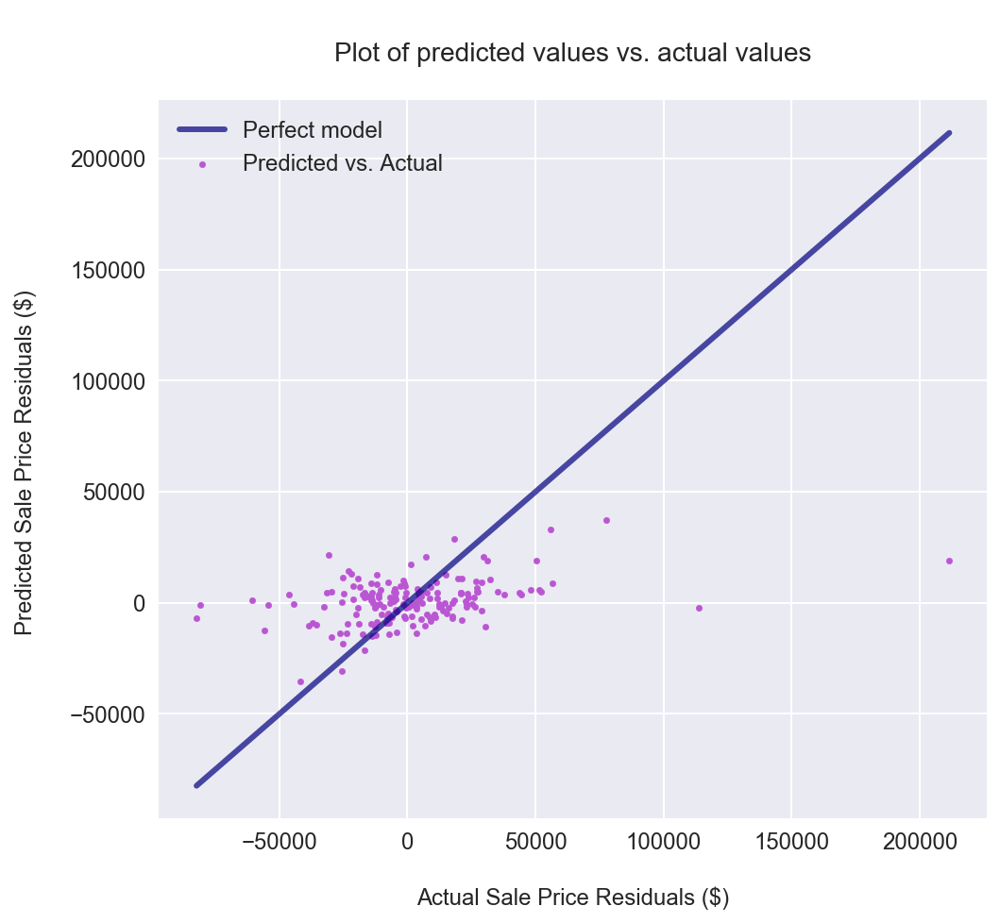

In [191]:
# Plot predictions for test data residuals from optimum lasso model vs actual residuals
predictions_r = optimum_lasso_r.predict(Xr_test_ss)

fig = plt.figure(figsize=(7,7))
ax = plt.gca()

ax.scatter(yr_test, predictions_r, color='mediumorchid', s=10, label='Predicted vs. Actual')

max_val = np.max(yr_test)
min_val = np.min(yr_test)

ax.plot([min_val, max_val], [min_val, max_val], color='navy',
        linewidth=3.0, alpha=0.7, label='Perfect model')
ax.tick_params(labelsize=12)


ax.set_xlabel('\nActual Sale Price Residuals ($)', fontsize=12)
ax.set_ylabel('Predicted Sale Price Residuals ($) \n', fontsize=12)
ax.set_title('\nPlot of predicted values vs. actual values\n', fontsize=14)

plt.legend(loc='upper left', fontsize=12 ) ;

In [192]:
# Look at the predictor coefficients in the Lasso
optimum_lasso_r_coeffs = pd.DataFrame({'variable': Xr_dumified.columns,
                             'coef': optimum_lasso_r.coef_,
                             'abs_coef': np.abs(optimum_lasso_r.coef_)})

optimum_lasso_r_coeffs.sort_values('abs_coef', inplace=True, ascending=False)

In [193]:
# Look at 10 most important/largest coefficients
optimum_lasso_r_coeffs.head(10)

,abs_coef,coef,variable
0,6251.636445,6251.636445,OverallQual
1,4766.043859,4766.043859,OverallCond
43,3814.248953,-3814.248953,KitchenQual_Gd
41,3625.143570,-3625.143570,BsmtFinType1_Unf
50,3008.786624,3008.786624,Functional_Typ
9,3006.327196,3006.327196,Exterior1st_BrkFace
44,1927.588329,-1927.588329,KitchenQual_TA
53,1643.254657,1643.254657,FireplaceQu_NA
32,1235.465308,-1235.465308,Exterior2nd_Stucco
27,1198.228990,1198.228990,Exterior2nd_ImStucc


In [194]:
# Look at 10 least important/smallest coefficients
optimum_lasso_r_coeffs.tail(10)

,abs_coef,coef,variable
21,0.0,-0.0,Exterior2nd_AsphShn
22,0.0,0.0,Exterior2nd_Brk Cmn
24,0.0,0.0,Exterior2nd_CBlock
25,0.0,0.0,Exterior2nd_CmentBd
28,0.0,0.0,Exterior2nd_MetalSd
29,0.0,-0.0,Exterior2nd_Other
30,0.0,-0.0,Exterior2nd_Plywood
34,0.0,0.0,Exterior2nd_Wd Sdng
36,0.0,0.0,BsmtFinType1_BLQ
65,0.0,-0.0,GarageCond_TA


As expected, the Lasso regularisation has zeroed a number of my predictor coefficients.

In [195]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(optimum_lasso_r.coef_ == 0)/float(Xr_dumified.shape[1])) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 57.58%.


Almost 60% of predictor coefficients were zeroed out by the Lasso regularisation confirming the speculation 
in section 2.4.1 that the model was overfitting the training data.

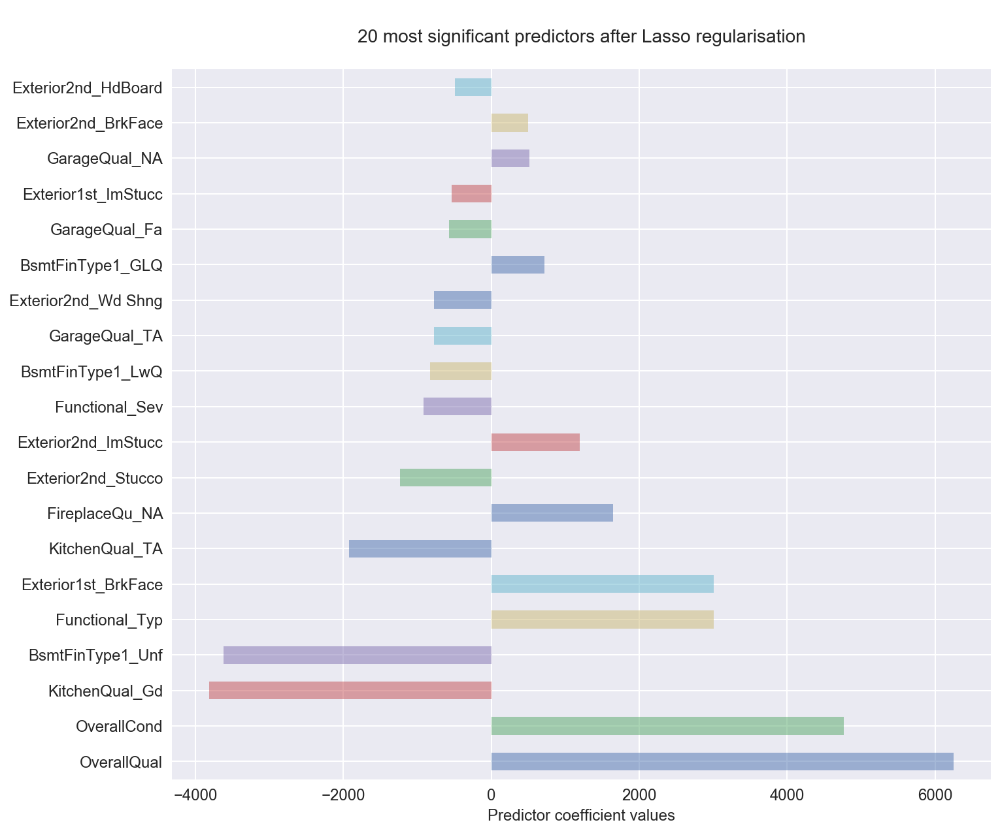

In [196]:
# Plot 20 largest coefficients
fig, ax = plt.subplots(figsize=(10,10))
title = '\n20 most significant predictors after Lasso regularisation\n'
optimum_lasso_r_coeffs.coef[:20].plot(kind='barh', ax=ax, alpha=0.5, fontsize=12)
ax.set_yticklabels(optimum_lasso_r_coeffs.variable[:20].values)
ax.set_xlabel('Predictor coefficient values', fontsize=12)
ax.set_title(title, fontsize=14);


The chart above provides further evidence as to why the model's accuracy in predicting the residuals is relatively poor.  The 2 most important/significant 
predictors are OverallQual and OverallCond which both had a relatively low correlation with the target (residuals) itself!

The predictor coefficients represent the monetary value of renovating a property such that the predictor's value moves 1 std from from it's current mean.  E.g. improve the overall quality of a house by 1 std of the current mean of that value, and you can expect to add $6,000 to the sales price (with a relatively low degress of accuracy given the performance of the model!).

I would trust my first model as a good indicator of which properties to buy (based on their fixed features), however I wouldn't trust a 
model's ability to accurately identify which properties to renovate and how.  Fixed features can be modeled with significantly more accuracy than renovateable features.

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. It is recommended to do some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [197]:
# A:
house['SaleCondition'].value_counts()

Normal     1194
Partial     125
Abnorml      96
Family       20
Alloca       11
AdjLand       4
Name: SaleCondition, dtype: int64

In [198]:
prob_majority_class = house['SaleCondition'].value_counts().max() / house['SaleCondition'].count()

print(f"The baseline accuracy (i.e. probability of predicting the majority class is: \
{round(prob_majority_class,2)}")


The baseline accuracy (i.e. probability of predicting the majority class is: 0.82


In [199]:
prob_abnormal_class = ((house['SaleCondition'] == 'Abnorml').sum()) / house['SaleCondition'].count()

print(f"The baseline accuracy of predicting an Abnormal sale is: \
{round(prob_abnormal_class,2)}")

The baseline accuracy of predicting an Abnormal sale is: 0.07


In [200]:
odds_ratio = prob_abnormal_class / (1 - prob_abnormal_class)

print(f"The odds ratio of a sale being Abnormal sale is: {round(odds_ratio,2)}")


The odds ratio of a sale being Abnormal sale is: 0.07



**********************************************************************************************

I haven't left myself any time to think about this question properly, so am going to conduct a very quick and simple investigation only.

**********************************************************************************************

In [201]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NA,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NA,NA,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NA,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NA,NA,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NA,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NA,NA,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NA,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NA,NA,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NA,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NA,NA,NaN,0,12,2008,WD,Normal,250000


In [202]:
# Create a very simple predictor matrix, comprising of 1 numeric and 1 categorical column only
X = house[['SalePrice', 'Neighborhood']]
y = house['SaleCondition']

In [203]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1450 entries, 0 to 1449
Data columns (total 2 columns):
SalePrice       1450 non-null int64
Neighborhood    1450 non-null object
dtypes: int64(1), object(1)
memory usage: 22.7+ KB


In [204]:
# Dumify Neighbor field in predictor data, dropping the first value for the field
X_dumified = pd.get_dummies(X, drop_first=True)
X_dumified.head()

,SalePrice,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker
0,208500,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,181500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,223500,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,140000,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,250000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [205]:
# Define train and test data sets
X_train = X_dumified[house['YrSold'] < 2010]  
X_test = X_dumified[house['YrSold'] == 2010]

y_train = y[house['YrSold'] < 2010]
y_test = y[house['YrSold'] == 2010]

In [206]:
# Standardise predictor matrix, using the mean and std from the training data to re-scale all my data
ss = StandardScaler()
ss.fit(X_train) 
X_train_ss = ss.transform(X_train) 
X_test_ss = ss.transform(X_test) 

In [207]:
# Train a KNN model on the train data and evaluate performance
from sklearn.neighbors import KNeighborsClassifier
knn20 = KNeighborsClassifier(n_neighbors = 20)
cross_val_score(knn20, X_train_ss, y_train, cv = 3)

array([0.81308411, 0.82159624, 0.82311321])

In [208]:
# Review values the model is predicting
sale_type_predictions = cross_val_predict(knn20, X_train_ss, y_train, cv=3)
df = pd.DataFrame(sale_type_predictions, columns=['Predictions'])
df['Predictions'].value_counts()

Normal     1261
Partial      17
Name: Predictions, dtype: int64

KNN model above only predicted the 2 most likely sales types ('Normal' and 'Partial').  
I wouldn't expect that increasing the number of neighbours will improve this.  
Will now test with a lower number of neighbors.

In [209]:
knn3 = KNeighborsClassifier(n_neighbors = 3)
cross_val_score(knn3, X_train_ss, y_train, cv = 3)

array([0.73364486, 0.7629108 , 0.75235849])

Scores aren't too bad, given simplicity of the model.

In [210]:
# Review values the model is predicting
sale_type_predictions = cross_val_predict(knn3, X_train_ss, y_train, cv=3)
df = pd.DataFrame(sale_type_predictions, columns=['Predictions'])
df['Predictions'].value_counts()

Normal     1137
Partial      83
Abnorml      44
Alloca        8
AdjLand       4
Family        2
Name: Predictions, dtype: int64

This has resulted in a better distribution of predicted sales types.
I'll now test this evaluate this model on my test data.

In [211]:
knn3.fit(X_train_ss, y_train)
knn3.score(X_test_ss, y_test)

0.8488372093023255

Score is suprisingly(!) good, especially given simplicity of model however the baseline accuracy was 0.82, so the model isn't really doing much better than simply predicting the majority class.

In [212]:
# Make a copy of the test data, and insert the true and predicted sale type
X_test = X_test.copy()
X_test['True sale type'] = y_test
X_test['Predicted sale type'] = knn3.predict(X_test_ss)

In [214]:
X_test.head()


,SalePrice,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,True sale type,Predicted sale type
16,149000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal
24,154000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Normal,Normal
26,134800,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Abnorml
27,306000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Normal,Normal
32,165500,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal


In [216]:
X_test['correct prediction'] = X_test['True sale type'] == X_test['Predicted sale type']
X_test.head()

,SalePrice,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,True sale type,Predicted sale type,correct prediction
16,149000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal,True
24,154000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Normal,Normal,True
26,134800,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Abnorml,False
27,306000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Normal,Normal,True
32,165500,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,Normal,Normal,True


In [218]:
X_test['correct prediction'].sum() / len(X_test['correct prediction'])

0.8488372093023255

The sales type was predicted corrected 84% of the time.  Note, this matches the accuracy score calculated above, but is only marginally better than simply predictig the baseline class.